In [ ]:
import numpy as np
import pandas as pd

In [ ]:
df = pd.read_csv('/content/Mono-Nanofluid-22102025.csv')

In [ ]:
from google.colab import files
uploaded = files.upload()  # Upload your Times New Roman font file

In [ ]:
import matplotlib.font_manager as fm

# Path to your uploaded Times New Roman font
font_path_regular = "/content/times.ttf"  # Adjust path if necessary

# Register the font (do this only once)
fm.fontManager.addfont(font_path_regular)
times_font = fm.FontProperties(fname=font_path_regular)

In [ ]:
df.columns

Index(['Nano_particle', 'base_fluid', 'volume_concentration', 'm_stirring_min',
       'sonication_min', 'particle_size_nm', 'temp_C', 'thermal_cond_W/m.K'],
      dtype='object')

✅ IQR Clipping applied.


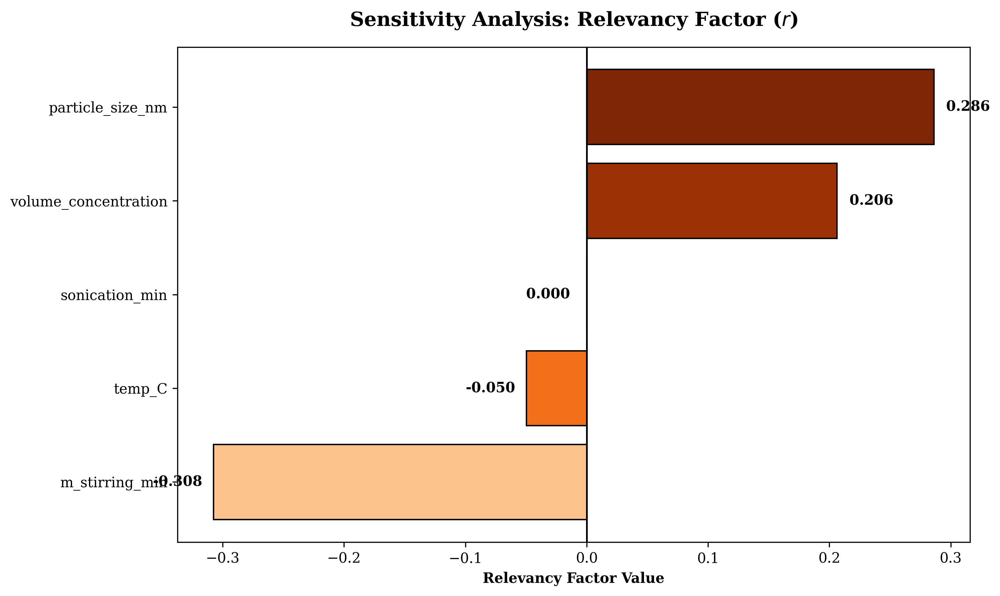

Fold 1 RMSE: 0.049514
Fold 2 RMSE: 0.062540
Fold 3 RMSE: 0.049108
Fold 4 RMSE: 0.060236
Fold 5 RMSE: 0.058427

📊 5-Fold CV Mean RMSE: 0.055965 ± 0.005589

✅ XGBoost: Final Test Performance
Test RMSE : 0.042158
Test MAE  : 0.014441
Test R²   : 0.965620


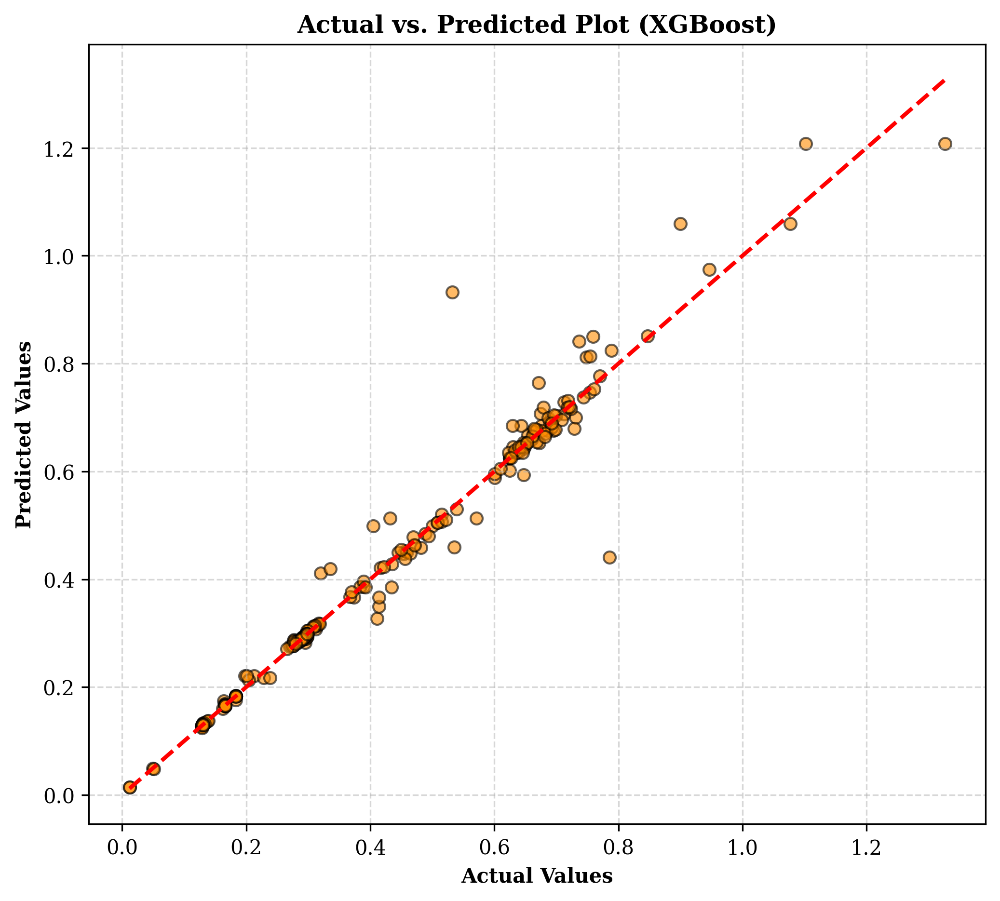

In [ ]:
# ===================== 1. IMPORTS & SETUP =========================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import seaborn as sns
from sklearn.model_selection import train_test_split, KFold
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from xgboost import XGBRegressor

# Font Setup - Adjust path if necessary
font_path = "/content/times.ttf"
try:
    fm.fontManager.addfont(font_path)
    plt.rcParams['font.family'] = 'Times New Roman'
except:
    plt.rcParams['font.family'] = 'serif'

# ===================== 2. DATA PREPARATION ====================
# Assuming 'df' is already loaded in your environment
target_col = 'thermal_cond_W/m.K'
cat_cols = ['Nano_particle', 'base_fluid']
num_cols = [c for c in df.columns if c not in cat_cols + [target_col]]

X = df[cat_cols + num_cols].copy()
y = df[target_col].copy()

# Remove rows with missing targets
mask = ~y.isna()
X = X[mask].reset_index(drop=True)
y = y[mask].reset_index(drop=True)

# ===================== 3. IQR CLIPPING (Clean Data) ======================
def iqr_clip(X_df, numeric_columns):
    X_temp = X_df.copy()
    Q1 = X_temp[numeric_columns].quantile(0.25)
    Q3 = X_temp[numeric_columns].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    for col in numeric_columns:
        X_temp[col] = X_temp[col].clip(lower[col], upper[col])
    return X_temp

X = iqr_clip(X, num_cols)
print("✅ IQR Clipping applied.")

# ================= 4. RELEVANCY FACTOR ANALYSIS (Sensitivity) ==================
# We do this BEFORE the split to see the global physical relationships
def calculate_relevancy_factor(X_df, y_df, numeric_cols):
    relevancy_factors = {}
    y_mean = y_df.mean()
    for col in numeric_cols:
        X_col = X_df[col]
        X_mean = X_col.mean()
        num = np.sum((X_col - X_mean) * (y_df - y_mean))
        den = np.sqrt(np.sum((X_col - X_mean)**2) * np.sum((y_df - y_mean)**2))
        relevancy_factors[col] = num / den if den != 0 else 0
    return pd.Series(relevancy_factors).sort_values(ascending=True)

rf_results = calculate_relevancy_factor(X, y, num_cols)

# Plotting Sensitivity Analysis (Dark Orange Gradient)
plt.figure(figsize=(10, 6), dpi=300)
norm = plt.Normalize(rf_results.min(), rf_results.max())
colors = plt.cm.Oranges(norm(rf_results.values) * 0.7 + 0.3)
bars = plt.barh(rf_results.index, rf_results.values, color=colors, edgecolor='black')

for bar in bars:
    width = bar.get_width()
    plt.text(width + (0.01 if width > 0 else -0.05), bar.get_y() + bar.get_height()/2,
             f'{width:.3f}', va='center', fontweight='bold')

plt.axvline(0, color='black', linewidth=1.2)
plt.title('Sensitivity Analysis: Relevancy Factor ($r$)', fontsize=14, fontweight='bold', pad=15)
plt.xlabel('Relevancy Factor Value', fontweight='bold')
plt.tight_layout()
plt.savefig('Step7_Sensitivity_Analysis.png', dpi=300)
plt.show()

# ================= 5. TRAIN–TEST SPLIT & PREPROCESSING ==================
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

numeric_pipeline = Pipeline([
    ("imputer", KNNImputer(n_neighbors=5)),
    ("scaler", StandardScaler())
])

categorical_pipeline = Pipeline([
    ("onehot", OneHotEncoder(sparse_output=False, handle_unknown="ignore"))
])

preprocessor = ColumnTransformer(transformers=[
    ("num", numeric_pipeline, num_cols),
    ("cat", categorical_pipeline, cat_cols)
])

# ================= 6. XGBOOST & CROSS-VALIDATION =================
xgb_reg = XGBRegressor(random_state=42, objective="reg:squarederror", n_estimators=1000, learning_rate=0.05, max_depth=6)
xgb_pipeline = Pipeline([("preprocessor", preprocessor), ("model", xgb_reg)])

kf = KFold(n_splits=5, shuffle=True, random_state=42)
cv_rmse = []

for fold, (train_idx, val_idx) in enumerate(kf.split(X_train)):
    X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

    xgb_pipeline.fit(X_tr, y_tr)
    y_val_pred = xgb_pipeline.predict(X_val)
    cv_rmse.append(np.sqrt(mean_squared_error(y_val, y_val_pred)))
    print(f"Fold {fold+1} RMSE: {cv_rmse[-1]:.6f}")

print(f"\n📊 5-Fold CV Mean RMSE: {np.mean(cv_rmse):.6f} ± {np.std(cv_rmse):.6f}")

# ================= 7. FINAL TEST & RESULTS =================
xgb_pipeline.fit(X_train, y_train)
y_test_pred = xgb_pipeline.predict(X_test)

print("\n✅ XGBoost: Final Test Performance")
print(f"Test RMSE : {np.sqrt(mean_squared_error(y_test, y_test_pred)):.6f}")
print(f"Test MAE  : {mean_absolute_error(y_test, y_test_pred):.6f}")
print(f"Test R²   : {r2_score(y_test, y_test_pred):.6f}")

# ================= 8. ACTUAL VS PREDICTED PLOT =================
plt.figure(figsize=(8, 7), dpi=300)
plt.scatter(y_test, y_test_pred, alpha=0.6, color='darkorange', edgecolor='k')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Actual Values', fontweight='bold')
plt.ylabel('Predicted Values', fontweight='bold')
plt.title('Actual vs. Predicted Plot (XGBoost)', fontweight='bold')
plt.grid(True, linestyle='--', alpha=0.5)
plt.savefig('Step4_Actual_vs_Predicted.png', dpi=300)
plt.show()

In [ ]:
# ===================== IMPORTS =========================
import numpy as np
import pandas as pd

from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.model_selection import train_test_split, KFold
from sklearn.impute import KNNImputer, SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from xgboost import XGBRegressor

# ===================== DATA PREPARATION ====================
# Assumes your dataframe is already loaded as: df

target_col = 'thermal_cond_W/m.K'
cat_cols = ['Nano_particle', 'base_fluid']

# numeric columns = all except categorical columns + target
num_cols = [c for c in df.columns if c not in cat_cols + [target_col]]

X = df[cat_cols + num_cols].copy()
y = df[target_col].copy()

# Remove rows with missing target
mask = ~y.isna()
X = X.loc[mask].reset_index(drop=True)
y = y.loc[mask].reset_index(drop=True)

print("Full dataset shape:", X.shape, y.shape)

# ===================== CUSTOM IQR CLIPPER ====================
class IQRClipper(BaseEstimator, TransformerMixin):
    def __init__(self, factor=1.5):
        self.factor = factor

    def fit(self, X, y=None):
        X = pd.DataFrame(X).copy()
        self.q1_ = X.quantile(0.25)
        self.q3_ = X.quantile(0.75)
        self.iqr_ = self.q3_ - self.q1_
        self.lower_ = self.q1_ - self.factor * self.iqr_
        self.upper_ = self.q3_ + self.factor * self.iqr_
        return self

    def transform(self, X):
        X = pd.DataFrame(X).copy()
        for col in X.columns:
            X[col] = X[col].clip(self.lower_[col], self.upper_[col])
        return X.values

# ================= 80:20 TRAIN–TEST SPLIT ==================
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42
)

X_train = X_train.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)
X_test = X_test.reset_index(drop=True)
y_test = y_test.reset_index(drop=True)

print("Train:", X_train.shape, "| Test:", X_test.shape)

# ======================= PREPROCESSING ======================
# Numeric pipeline:
# IQR clipping is INSIDE the pipeline now, so no data leakage
numeric_pipeline = Pipeline([
    ("iqr_clip", IQRClipper(factor=1.5)),
    ("imputer", KNNImputer(n_neighbors=5)),
    ("scaler", StandardScaler())
])

# OneHotEncoder compatibility across sklearn versions
try:
    ohe = OneHotEncoder(sparse_output=False, handle_unknown="ignore")
except TypeError:
    ohe = OneHotEncoder(sparse=False, handle_unknown="ignore")

# Categorical pipeline
categorical_pipeline = Pipeline([
    ("imputer", SimpleImputer(strategy="most_frequent")),
    ("onehot", ohe)
])

# ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_pipeline, num_cols),
        ("cat", categorical_pipeline, cat_cols)
    ]
)

# ================= BASE XGBOOST MODEL =================
xgb_reg = XGBRegressor(
    random_state=42,
    objective="reg:squarederror",
    eval_metric="rmse",
    n_estimators=3000,
    learning_rate=0.01,
    max_depth=10,
    subsample=0.8,
    colsample_bytree=0.8,
    reg_lambda=1.0,
    reg_alpha=0.1
)

# Full pipeline: preprocessing + model
xgb_pipeline = Pipeline([
    ("preprocessor", preprocessor),
    ("model", xgb_reg)
])

# =============== 5-FOLD CROSS-VALIDATION =================
kf = KFold(n_splits=5, shuffle=True, random_state=42)

cv_rmse, cv_r2 = [], []

for fold, (train_idx, val_idx) in enumerate(kf.split(X_train), start=1):
    X_tr = X_train.iloc[train_idx]
    X_val = X_train.iloc[val_idx]
    y_tr = y_train.iloc[train_idx]
    y_val = y_train.iloc[val_idx]

    # Fit pipeline on fold training data only
    xgb_pipeline.fit(X_tr, y_tr)

    # Predict on validation fold
    y_val_pred = xgb_pipeline.predict(X_val)

    rmse = np.sqrt(mean_squared_error(y_val, y_val_pred))
    r2 = r2_score(y_val, y_val_pred)

    cv_rmse.append(rmse)
    cv_r2.append(r2)

    print(f"Fold {fold} -> RMSE: {rmse:.6f}, R²: {r2:.6f}")

print("\n5-Fold CV Performance (Training Set)")
print(f"Mean RMSE: {np.mean(cv_rmse):.6f} ± {np.std(cv_rmse):.6f}")
print(f"Mean R²  : {np.mean(cv_r2):.6f} ± {np.std(cv_r2):.6f}")

# ================= FINAL TRAINING & TEST =================
# Retrain on full training data
xgb_pipeline.fit(X_train, y_train)

# Predict on test set
y_test_pred_xgb = xgb_pipeline.predict(X_test)

# ================= FINAL TEST METRICS =====================
mse_test_xgb = mean_squared_error(y_test, y_test_pred_xgb)
rmse_test_xgb = np.sqrt(mse_test_xgb)
mae_test_xgb = mean_absolute_error(y_test, y_test_pred_xgb)

# MAPE with zero-safe denominator
mape_test_xgb = np.mean(
    np.abs((y_test - y_test_pred_xgb) / np.where(y_test == 0, 1e-8, y_test))
) * 100

r2_test_xgb = r2_score(y_test, y_test_pred_xgb)

print("\nXGBoost: Final Test Performance (20% Holdout Set)")
print(f"Test MSE  : {mse_test_xgb:.6f}")
print(f"Test RMSE : {rmse_test_xgb:.6f}")
print(f"Test MAE  : {mae_test_xgb:.6f}")
print(f"Test MAPE : {mape_test_xgb:.2f} %")
print(f"Test R²   : {r2_test_xgb:.6f}")

global_min = min(y_test.min(), y_test_pred_xgb.min())
global_max = max(y_test.max(), y_test_pred_xgb.max())
print("Global axis limits (XGBoost):", global_min, global_max)

Full dataset shape: (1257, 7) (1257,)
Train: (1005, 7) | Test: (252, 7)
Fold 1 -> RMSE: 0.047918, R²: 0.953014
Fold 2 -> RMSE: 0.059260, R²: 0.941463
Fold 3 -> RMSE: 0.048559, R²: 0.955272
Fold 4 -> RMSE: 0.063296, R²: 0.923589
Fold 5 -> RMSE: 0.052543, R²: 0.954082

5-Fold CV Performance (Training Set)
Mean RMSE: 0.054315 ± 0.006039
Mean R²  : 0.945484 ± 0.012017

XGBoost: Final Test Performance (20% Holdout Set)
Test MSE  : 0.001803
Test RMSE : 0.042460
Test MAE  : 0.015346
Test MAPE : 4.23 %
Test R²   : 0.965127
Global axis limits (XGBoost): 0.01189 1.3261


In [ ]:
df.shape

(1491, 8)

In [ ]:
!pip install catboost lightgbm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 97.1/97.1 MB 9.1 MB/s eta 0:00:00


In [ ]:
# =========================================================
# COMPLETE META-LEARNER STACKING PIPELINE
# =========================================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, KFold
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import RidgeCV

from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor

# 1. DATA PREPARATION
target_col = 'thermal_cond_W/m.K'
cat_cols = ['Nano_particle', 'base_fluid']
num_cols = [c for c in df.columns if c not in cat_cols + [target_col]]

X = df[cat_cols + num_cols].copy()
y = df[target_col].copy()

mask = ~y.isna()
X = X[mask].reset_index(drop=True)
y = y[mask].reset_index(drop=True)

# 2. IQR CLIPPING
def iqr_clip(X, num_cols):
    X = X.copy()
    Q1 = X[num_cols].quantile(0.25)
    Q3 = X[num_cols].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    for col in num_cols:
        X[col] = X[col].clip(lower[col], upper[col])
    return X

X = iqr_clip(X, num_cols)

# 3. TRAIN–TEST SPLIT
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42
)

# 4. PREPROCESSING PIPELINE
numeric_pipeline = Pipeline([
    ("imputer", KNNImputer(n_neighbors=5)),
    ("scaler", StandardScaler())
])

try:
    ohe = OneHotEncoder(sparse_output=False, handle_unknown="ignore")
except TypeError:
    ohe = OneHotEncoder(sparse=False, handle_unknown="ignore")

categorical_pipeline = Pipeline([("onehot", ohe)])

preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_pipeline, num_cols),
        ("cat", categorical_pipeline, cat_cols)
    ]
)

# 5. BASE MODELS DEFINITION
xgb_model = XGBRegressor(
    random_state=42, n_estimators=3000, learning_rate=0.01,
    max_depth=10, subsample=0.8, colsample_bytree=0.8, reg_lambda=1.0, reg_alpha=0.1
)

cat_model = CatBoostRegressor(
    random_state=42, iterations=3000, learning_rate=0.01,
    depth=10, l2_leaf_reg=3, verbose=0
)

lgb_model = LGBMRegressor(
    random_state=42, n_estimators=3000, learning_rate=0.01,
    max_depth=10, subsample=0.8, colsample_bytree=0.8, reg_lambda=1.0, reg_alpha=0.1,
    verbose=-1
)

# 6. STACKING ENSEMBLE (The "Power" Move)
stacking_model = StackingRegressor(
    estimators=[
        ('xgb', xgb_model),
        ('cat', cat_model),
        ('lgb', lgb_model)
    ],
    final_estimator=RidgeCV(), # Meta-learner finds optimal weights
    cv=5,                      # Internal cross-validation for meta-features
    n_jobs=-1
)

stacking_pipeline = Pipeline([
    ("preprocessor", preprocessor),
    ("model", stacking_model)
])

# 7. 5-FOLD CROSS-VALIDATION
kf = KFold(n_splits=5, shuffle=True, random_state=42)
cv_rmse, cv_r2 = [], []

print("🚀 Training Meta-Learner Stacking (5-Fold CV)...")
for fold, (train_idx, val_idx) in enumerate(kf.split(X_train)):
    X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

    stacking_pipeline.fit(X_tr, y_tr)
    y_val_pred = stacking_pipeline.predict(X_val)

    cv_rmse.append(np.sqrt(mean_squared_error(y_val, y_val_pred)))
    cv_r2.append(r2_score(y_val, y_val_pred))
    print(f"Fold {fold+1} Completed.")

print(f"\n📊 CV Results: Mean RMSE: {np.mean(cv_rmse):.6f}, Mean R²: {np.mean(cv_r2):.6f}")

# 8. FINAL TRAINING & EVALUATION
stacking_pipeline.fit(X_train, y_train)
y_test_pred = stacking_pipeline.predict(X_test)

# Metrics Calculation
mse_test = mean_squared_error(y_test, y_test_pred)
rmse_test = np.sqrt(mse_test)
mae_test = mean_absolute_error(y_test, y_test_pred)
mape_test = np.mean(np.abs((y_test - y_test_pred) / np.where(y_test == 0, 1e-8, y_test))) * 100
r2_test = r2_score(y_test, y_test_pred)
bias = (np.mean(y_test - y_test_pred) / np.mean(y_test)) * 100

print("\n🏆 FINAL STACKING PERFORMANCE")
print("-" * 30)
print(f"Test RMSE : {rmse_test:.6f}")
print(f"Test MAE  : {mae_test:.6f}")
print(f"Test MAPE : {mape_test:.2f} %")
print(f"Test R²   : {r2_test:.6f}")
print(f"Bias (%)  : {bias:.4f}")

# Meta-learner insight
meta_weights = stacking_pipeline.named_steps['model'].final_estimator_.coef_
print("\n⚖️ Meta-Learner Weights (Trust Levels):")
for name, weight in zip(['XGB', 'CatBoost', 'LGBM'], meta_weights):
    print(f"{name}: {weight:.4f}")

🚀 Training Meta-Learner Stacking (5-Fold CV)...


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


Fold 1 Completed.


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


Fold 2 Completed.


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


Fold 3 Completed.


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


Fold 4 Completed.


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


Fold 5 Completed.

📊 CV Results: Mean RMSE: 0.055854, Mean R²: 0.942442

🏆 FINAL STACKING PERFORMANCE
------------------------------
Test RMSE : 0.040077
Test MAE  : 0.016358
Test MAPE : 4.66 %
Test R²   : 0.968930
Bias (%)  : 0.0485

⚖️ Meta-Learner Weights (Trust Levels):
XGB: 0.8521
CatBoost: 0.2247
LGBM: -0.1012


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


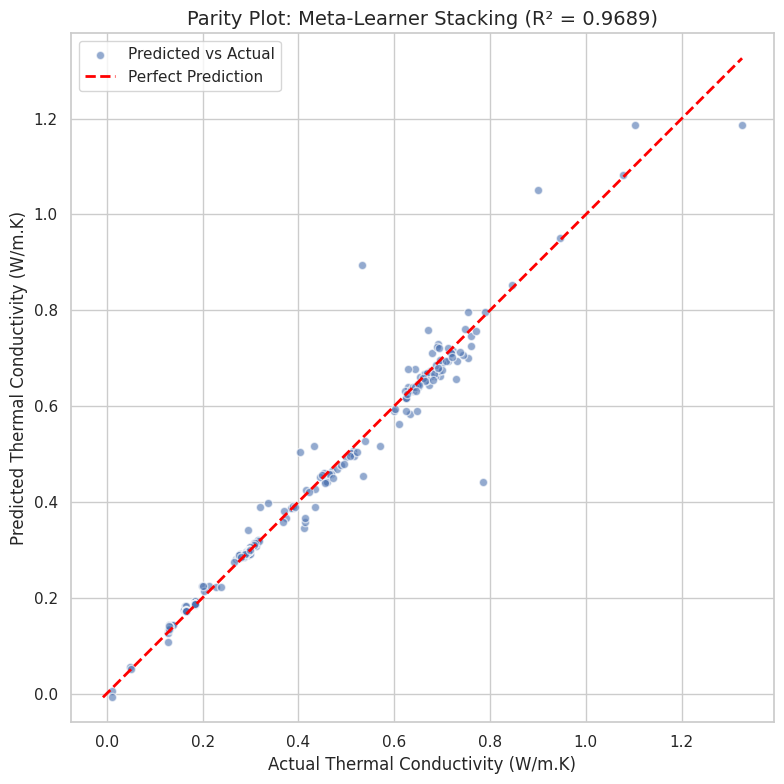

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# 1. SET STYLE
sns.set_theme(style="whitegrid")
plt.figure(figsize=(8, 8))

# 2. CREATE SCATTER PLOT
# Using alpha=0.6 helps see density if points overlap
plt.scatter(y_test, y_test_pred, alpha=0.6, edgecolors='w', label='Predicted vs Actual')

# 3. ADD THE PARITY LINE (y = x)
# The line starts from the minimum value to the maximum value of the test set
min_val = min(min(y_test), min(y_test_pred))
max_val = max(max(y_test), max(y_test_pred))
plt.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', lw=2, label='Perfect Prediction')

# 4. LABELS AND ANNOTATIONS
plt.xlabel('Actual Thermal Conductivity (W/m.K)', fontsize=12)
plt.ylabel('Predicted Thermal Conductivity (W/m.K)', fontsize=12)
plt.title(f'Parity Plot: Meta-Learner Stacking (R² = {r2_test:.4f})', fontsize=14)
plt.legend(loc='upper left')

# 5. FORCE EQUAL AXES (Crucial for a true 45-degree parity look)
plt.axis('equal')
plt.tight_layout()

# Display the plot
plt.show()

In [ ]:
# 1. CREATE A RESULTS DATAFRAME
# We combine the original test features with the actual and predicted values
results_df = X_test.copy()
results_df['Actual'] = y_test.values
results_df['Predicted'] = y_test_pred

# 2. CALCULATE ERRORS
# Absolute Error tells us the magnitude of the "miss"
results_df['Abs_Error'] = np.abs(results_df['Actual'] - results_df['Predicted'])

# 3. IDENTIFY TOP 5 WORST PREDICTIONS
# Sorting by Absolute Error in descending order
top_5_errors = results_df.sort_values(by='Abs_Error', ascending=False).head(5)

print("❌ Top 5 Worst Predictions (Highest Error):")
print(top_5_errors)

# 4. (Optional) Check the average characteristics of these outliers
print("\n📝 Average features of these 5 problematic samples:")
print(top_5_errors[cat_cols + num_cols].describe(include='all'))


❌ Top 5 Worst Predictions (Highest Error):
     Nano_particle base_fluid  volume_concentration  m_stirring_min  \
1087         MWCNT        DIW              0.030062             NaN   
147          Al2O3         EG              0.016000            60.0   
651          MWCNT        DIW              0.030062           120.0   
486        CoFe2O4        DIW              0.030062            60.0   
380          Al2O3   EG/Water              0.010000             NaN   

      sonication_min  particle_size_nm  temp_C    Actual  Predicted  Abs_Error  
1087           120.0               NaN    50.0  0.531800   0.893955   0.362155  
147            120.0              53.0    10.0  0.785400   0.442480   0.342920  
651            120.0               NaN    45.0  0.899775   1.051585   0.151809  
486            120.0              25.0    50.0  1.326100   1.186442   0.139658  
380              NaN             120.0    30.0  0.404300   0.504596   0.100296  

📝 Average features of these 5 problematic s

In [ ]:
# ===================== IMPORTS =========================
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, KFold
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import VotingRegressor

from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor

# ===================== DATA PREPARATION ====================
target_col = 'thermal_cond_W/m.K'
cat_cols = ['Nano_particle', 'base_fluid']

num_cols = [c for c in df.columns if c not in cat_cols + [target_col]]

X = df[cat_cols + num_cols].copy()
y = df[target_col].copy()

mask = ~y.isna()
X = X[mask].reset_index(drop=True)
y = y[mask].reset_index(drop=True)

# ===================== IQR CLIPPING ======================
def iqr_clip(X, num_cols):
    X = X.copy()
    Q1 = X[num_cols].quantile(0.25)
    Q3 = X[num_cols].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    for col in num_cols:
        X[col] = X[col].clip(lower[col], upper[col])
    return X

X = iqr_clip(X, num_cols)

# ================= TRAIN–TEST SPLIT ==================
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42
)

X_train = X_train.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)
X_test  = X_test.reset_index(drop=True)
y_test  = y_test.reset_index(drop=True)

# ======================= PREPROCESSING ======================
numeric_pipeline = Pipeline([
    ("imputer", KNNImputer(n_neighbors=5)),
    ("scaler", StandardScaler())
])

try:
    ohe = OneHotEncoder(sparse_output=False, handle_unknown="ignore")
except TypeError:
    ohe = OneHotEncoder(sparse=False, handle_unknown="ignore")

categorical_pipeline = Pipeline([
    ("onehot", ohe)
])

preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_pipeline, num_cols),
        ("cat", categorical_pipeline, cat_cols)
    ]
)

# ================= MODELS =================

xgb_model = XGBRegressor(
    random_state=42,
    objective="reg:squarederror",
    eval_metric="rmse",
    n_estimators=3000,
    learning_rate=0.01,
    max_depth=10,
    subsample=0.8,
    colsample_bytree=0.8,
    reg_lambda=1.0,
    reg_alpha=0.1
)

cat_model = CatBoostRegressor(
    random_state=42,
    iterations=3000,
    learning_rate=0.01,
    depth=10,
    l2_leaf_reg=3,
    verbose=0
)

lgb_model = LGBMRegressor(
    random_state=42,
    n_estimators=3000,
    learning_rate=0.01,
    max_depth=10,
    subsample=0.8,
    colsample_bytree=0.8,
    reg_lambda=1.0,
    reg_alpha=0.1
)

# ================= ENSEMBLE =================
ensemble_model = VotingRegressor(
    estimators=[
        ('xgb', xgb_model),
        ('cat', cat_model),
        ('lgb', lgb_model)
    ]
)

ensemble_pipeline = Pipeline([
    ("preprocessor", preprocessor),
    ("model", ensemble_model)
])

# ================= 5-FOLD CROSS-VALIDATION =================
kf = KFold(n_splits=5, shuffle=True, random_state=42)

cv_rmse, cv_r2 = [], []

for fold, (train_idx, val_idx) in enumerate(kf.split(X_train)):
    X_tr = X_train.iloc[train_idx]
    X_val = X_train.iloc[val_idx]
    y_tr = y_train.iloc[train_idx]
    y_val = y_train.iloc[val_idx]

    ensemble_pipeline.fit(X_tr, y_tr)
    y_val_pred = ensemble_pipeline.predict(X_val)

    rmse = np.sqrt(mean_squared_error(y_val, y_val_pred))
    r2 = r2_score(y_val, y_val_pred)

    cv_rmse.append(rmse)
    cv_r2.append(r2)

    print(f"Fold {fold+1} → RMSE: {rmse:.6f}, R²: {r2:.6f}")

print("\n📊 5-Fold CV Performance (Training Set)")
print(f"Mean RMSE: {np.mean(cv_rmse):.6f} ± {np.std(cv_rmse):.6f}")
print(f"Mean R²  : {np.mean(cv_r2):.6f} ± {np.std(cv_r2):.6f}")

# ================= FINAL TRAINING & TEST =================
ensemble_pipeline.fit(X_train, y_train)
y_test_pred = ensemble_pipeline.predict(X_test)

# ================= FINAL TEST METRICS =====================
mse_test = mean_squared_error(y_test, y_test_pred)
rmse_test = np.sqrt(mse_test)
mae_test  = mean_absolute_error(y_test, y_test_pred)

mape_test = np.mean(
    np.abs((y_test - y_test_pred) / np.where(y_test == 0, 1e-8, y_test))
) * 100

r2_test = r2_score(y_test, y_test_pred)

residuals = y_test - y_test_pred
relative_bias = np.mean(residuals) / np.mean(y_test) * 100

print("\n✅ Ensemble (XGB + Cat + LGB): Final Test Performance")
print(f"Test MSE  : {mse_test:.6f}")
print(f"Test RMSE : {rmse_test:.6f}")
print(f"Test MAE  : {mae_test:.6f}")
print(f"Test MAPE : {mape_test:.2f} %")
print(f"Test R²   : {r2_test:.6f}")
print(f"Relative Bias (%): {relative_bias:.4f}")

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000820 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 168
[LightGBM] [Info] Number of data points in the train set: 804, number of used features: 26
[LightGBM] [Info] Start training from score 0.419355
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


Fold 1 → RMSE: 0.053288, R²: 0.941892
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000107 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 170
[LightGBM] [Info] Number of data points in the train set: 804, number of used features: 24
[LightGBM] [Info] Start training from score 0.416989
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


Fold 2 → RMSE: 0.063799, R²: 0.932154
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000083 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 175
[LightGBM] [Info] Number of data points in the train set: 804, number of used features: 23
[LightGBM] [Info] Start training from score 0.423108
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


Fold 3 → RMSE: 0.057896, R²: 0.936417
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000075 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 804, number of used features: 24
[LightGBM] [Info] Start training from score 0.423017
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


Fold 4 → RMSE: 0.063358, R²: 0.923441
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000079 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 170
[LightGBM] [Info] Number of data points in the train set: 804, number of used features: 24
[LightGBM] [Info] Start training from score 0.418969
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


Fold 5 → RMSE: 0.062529, R²: 0.934968

📊 5-Fold CV Performance (Training Set)
Mean RMSE: 0.060174 ± 0.004036
Mean R²  : 0.933774 ± 0.006062
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000090 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 192
[LightGBM] [Info] Number of data points in the train set: 1005, number of used features: 29
[LightGBM] [Info] Start training from score 0.420287
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


# Base Model

In [ ]:
# ===================== IMPORTS =========================

from sklearn.model_selection import train_test_split, KFold
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from xgboost import XGBRegressor

# ===================== DATA PREPARATION ====================
target_col = 'thermal_cond_W/m.K'
cat_cols = ['Nano_particle', 'base_fluid']

# numeric columns = all except cats + target
num_cols = [c for c in df.columns if c not in cat_cols + [target_col]]

X = df[cat_cols + num_cols].copy()
y = df[target_col].copy()

# Remove rows with missing targets
mask = ~y.isna()
X = X[mask].reset_index(drop=True)
y = y[mask].reset_index(drop=True)

# ===================== ✅ IQR CLIPPING ======================
def iqr_clip(X, num_cols):
    X = X.copy()
    Q1 = X[num_cols].quantile(0.25)
    Q3 = X[num_cols].quantile(0.75)
    IQR = Q3 - Q1

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    for col in num_cols:
        X[col] = X[col].clip(lower[col], upper[col])

    return X

X = iqr_clip(X, num_cols)
print("✅ IQR Clipping applied (no rows removed)")

# ================= 80:20 TRAIN–TEST SPLIT ==================
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42
)

X_train = X_train.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)
X_test  = X_test.reset_index(drop=True)
y_test  = y_test.reset_index(drop=True)

print("Train:", X_train.shape, "| Test:", X_test.shape)

# ======================= PREPROCESSING ======================
numeric_pipeline = Pipeline([
    ("imputer", KNNImputer(n_neighbors=5)),
    ("scaler", StandardScaler())
])

try:
    ohe = OneHotEncoder(sparse_output=False, handle_unknown="ignore")
except TypeError:
    ohe = OneHotEncoder(sparse=False, handle_unknown="ignore")

categorical_pipeline = Pipeline([
    ("onehot", ohe)
])

preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_pipeline, num_cols),
        ("cat", categorical_pipeline, cat_cols)
    ]
)

# =============== 🌳 BASE XGBoost MODEL =================
xgb_reg = XGBRegressor(
    random_state=42,
    objective="reg:squarederror",
    eval_metric="rmse",
    n_estimators=3000,
    learning_rate=0.01,
    max_depth=10,
    subsample=0.8,
    colsample_bytree=0.8,
    reg_lambda=1.0,
    reg_alpha=0.1
)

# Full pipeline: preprocessing + model
xgb_pipeline = Pipeline([
    ("preprocessor", preprocessor),
    ("model", xgb_reg)
])

# =============== ✅ 5-FOLD CROSS-VALIDATION =================
kf = KFold(n_splits=5, shuffle=True, random_state=42)

cv_rmse, cv_r2 = [], []

for fold, (train_idx, val_idx) in enumerate(kf.split(X_train)):
    X_tr = X_train.iloc[train_idx]
    X_val = X_train.iloc[val_idx]
    y_tr = y_train.iloc[train_idx]
    y_val = y_train.iloc[val_idx]

    # Fit pipeline on fold training data
    xgb_pipeline.fit(X_tr, y_tr)

    # Predict on validation fold
    y_val_pred = xgb_pipeline.predict(X_val)

    rmse = np.sqrt(mean_squared_error(y_val, y_val_pred))
    r2 = r2_score(y_val, y_val_pred)

    cv_rmse.append(rmse)
    cv_r2.append(r2)

    print(f"Fold {fold+1} → RMSE: {rmse:.6f}, R²: {r2:.6f}")

print("\n📊 5-Fold CV Performance (Training Set)")
print(f"Mean RMSE: {np.mean(cv_rmse):.6f} ± {np.std(cv_rmse):.6f}")
print(f"Mean R²  : {np.mean(cv_r2):.6f} ± {np.std(cv_r2):.6f}")

# ================= ✅ FINAL TRAINING & TEST =================
# Retrain on full training data
xgb_pipeline.fit(X_train, y_train)

# Predict on test set
y_test_pred_xgb = xgb_pipeline.predict(X_test)

# ================= ✅ FINAL TEST METRICS =====================
mse_test_xgb = mean_squared_error(y_test, y_test_pred_xgb)
rmse_test_xgb = np.sqrt(mse_test_xgb)
mae_test_xgb  = mean_absolute_error(y_test, y_test_pred_xgb)

# MAPE with zero-safe denominator
mape_test_xgb = np.mean(
    np.abs((y_test - y_test_pred_xgb) / np.where(y_test == 0, 1e-8, y_test))
) * 100

r2_test_xgb = r2_score(y_test, y_test_pred_xgb)

print("\n✅ XGBoost: Final Test Performance (20% Holdout Set)")
print(f"Test MSE  : {mse_test_xgb:.6f}")
print(f"Test RMSE : {rmse_test_xgb:.6f}")
print(f"Test MAE  : {mae_test_xgb:.6f}")
print(f"Test MAPE : {mape_test_xgb:.2f} %")
print(f"Test R²   : {r2_test_xgb:.6f}")
global_min = min(y_test.min(), y_test_pred_xgb.min())
global_max = max(y_test.max(), y_test_pred_xgb.max())
print("✅ Global axis limits (XGBoost):", global_min, global_max)

✅ IQR Clipping applied (no rows removed)
Train: (1005, 7) | Test: (252, 7)
Fold 1 → RMSE: 0.047713, R²: 0.953414
Fold 2 → RMSE: 0.058984, R²: 0.942008
Fold 3 → RMSE: 0.046966, R²: 0.958158
Fold 4 → RMSE: 0.064383, R²: 0.920944
Fold 5 → RMSE: 0.052478, R²: 0.954196

📊 5-Fold CV Performance (Training Set)
Mean RMSE: 0.054105 ± 0.006692
Mean R²  : 0.945744 ± 0.013516

✅ XGBoost: Final Test Performance (20% Holdout Set)
Test MSE  : 0.001806
Test RMSE : 0.042499
Test MAE  : 0.015336
Test MAPE : 4.23 %
Test R²   : 0.965061
✅ Global axis limits (XGBoost): 0.01189 1.3261


In [ ]:
residuals = y_test - y_test_pred_xgb
print("Mean Residual:", np.mean(residuals))

Mean Residual: -0.0007392007290707498


In [ ]:
relative_bias = np.mean(residuals) / np.mean(y_test)
print("Relative Bias (%):", relative_bias * 100)

Relative Bias (%): -0.1792534665324119


line comparison plot XGB

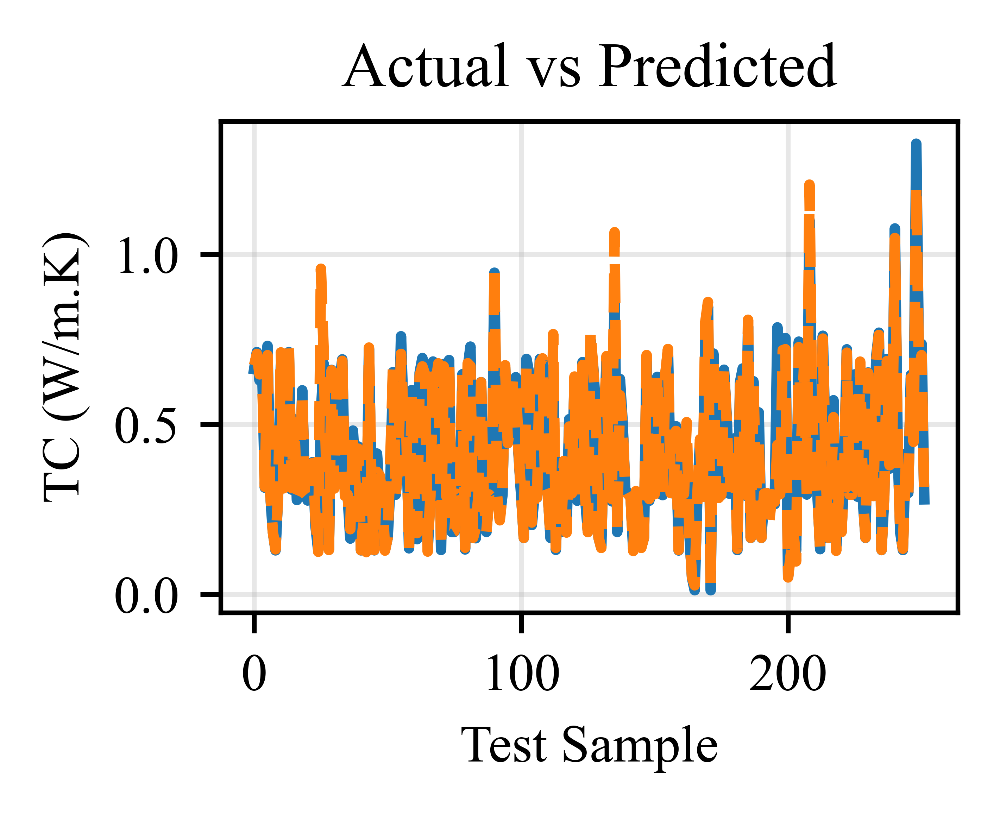

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.font_manager as fm

# ---------------- FONT ----------------
font_path_regular = "/content/times.ttf"
fm.fontManager.addfont(font_path_regular)

plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 9

# ---------------- PLOT ----------------
plt.figure(figsize=(2.5,2), dpi=1200)

idx = np.arange(len(y_test))

plt.plot(idx, y_test.values, linewidth=1.8, label="Actual")
plt.plot(idx, y_test_pred_xgb, linewidth=1.8, linestyle="--", label="Predicted")

plt.xlabel("Test Sample")
plt.ylabel("TC (W/m.K)")
plt.title("Actual vs Predicted")

#plt.legend(frameon=False)
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

Scatter plot XGB

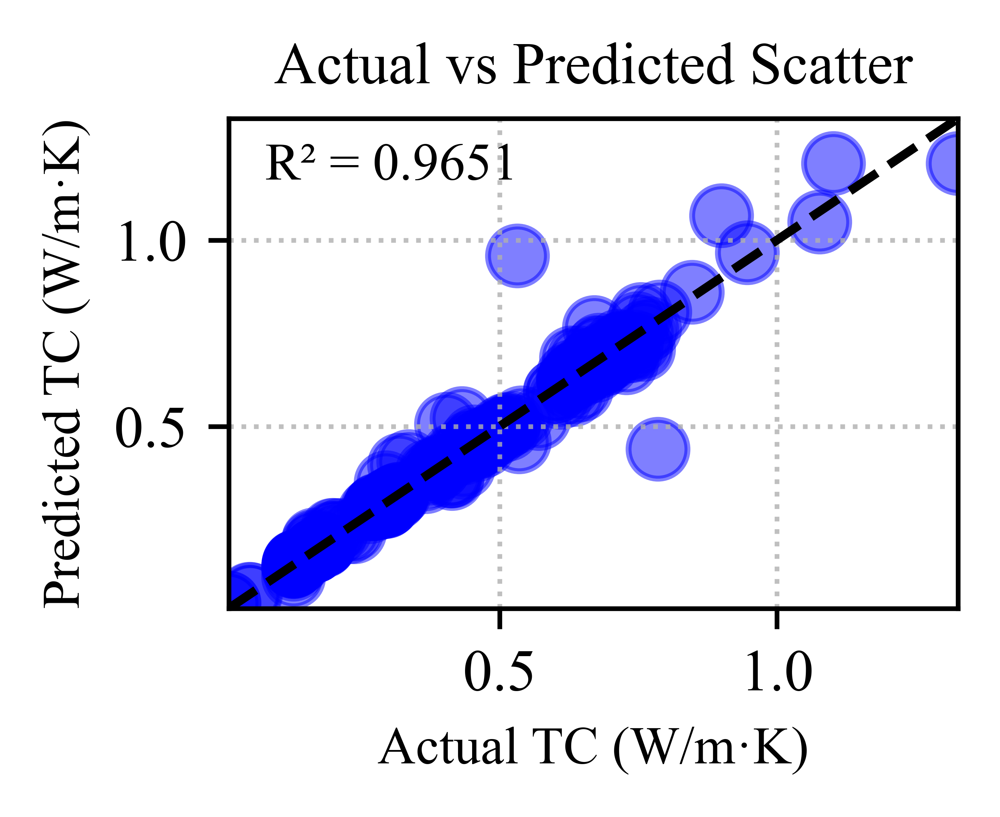

In [ ]:
import matplotlib.pyplot as plt

# Assuming the following variables are defined: y_test, y_test_pred_xgb, r2_test_xgb, global_min, global_max

plt.figure(figsize=(2.5,2), dpi=1200)

# Scatter plot (blue with larger size)
plt.scatter(y_test,y_test_pred_xgb,s=100,  alpha=0.5,  color='blue', marker='o')

# Perfect fit line
plt.plot(
    [global_min, global_max],
    [global_min, global_max],
    linestyle='--',
    color='black'
)

# ✅ FORCE SAME SCALE
plt.xlim(global_min, global_max)
plt.ylim(global_min, global_max)

# Labels and title
plt.xlabel("Actual TC (W/m·K)", fontsize=9, fontproperties=times_font)
plt.ylabel("Predicted TC (W/m·K)", fontsize=9, fontproperties=times_font)
plt.title("Actual vs Predicted Scatter", fontsize=9, fontproperties=times_font)

# Display R² value
plt.text(
    0.05, 0.95,
    f"R² = {r2_test_xgb:.4f}",
    transform=plt.gca().transAxes,
    verticalalignment='top',
    fontsize=9, fontproperties=times_font
)
# Apply Times New Roman font to the x-ticks and y-ticks
plt.xticks(fontsize=9, fontproperties=times_font)
plt.yticks(fontsize=9, fontproperties=times_font)

# Grid settings
plt.grid(True, linestyle=':', alpha=0.8)

# Make the layout tight
plt.tight_layout()
#plt.savefig('/content/high_res_plot1.pdf', format='pdf', dpi=1200)
#plt.savefig('/content/xgboost_actual_vs_predicted.png', format='png', dpi=1200, transparent=True)
# Show the plot
plt.show()

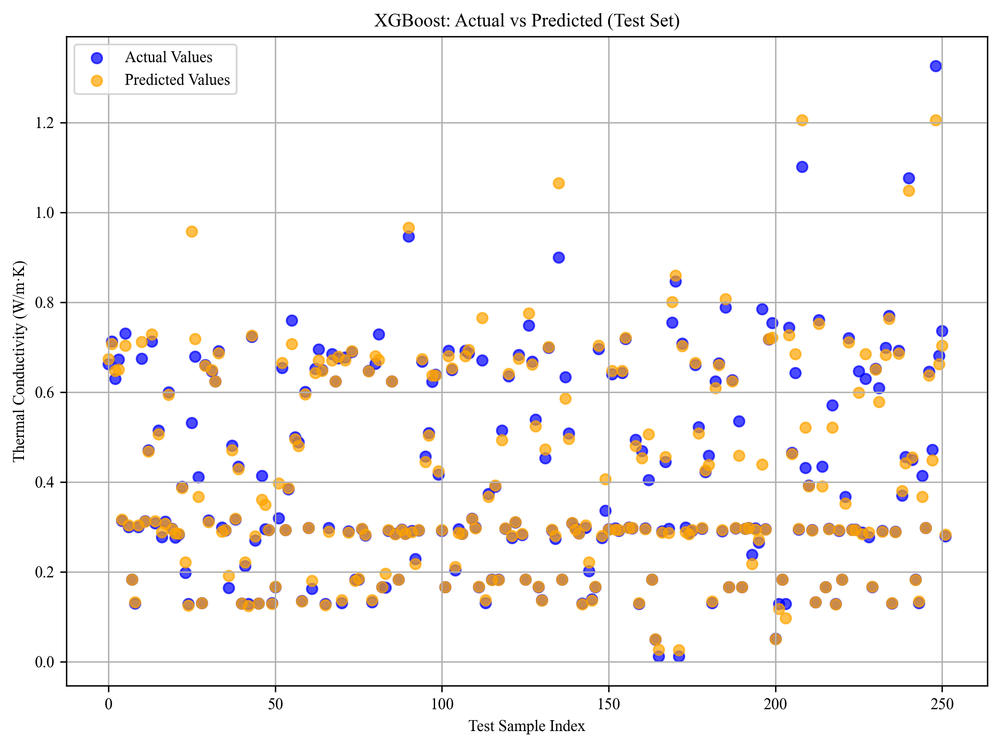

In [ ]:
# ================= 📊 ACTUAL vs PREDICTED (INDEX PLOT) =================
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(8, 6), dpi=300)

# Create index for test samples
indices = np.arange(len(y_test))

# Plot actual values
plt.scatter(indices, y_test,
            color='blue',
            label='Actual Values',
            alpha=0.7)

# Plot predicted values
plt.scatter(indices, y_test_pred_xgb,
            color='orange',
            label='Predicted Values',
            alpha=0.7)

plt.xlabel("Test Sample Index")
plt.ylabel("Thermal Conductivity (W/m·K)")
plt.title("XGBoost: Actual vs Predicted (Test Set)")

plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

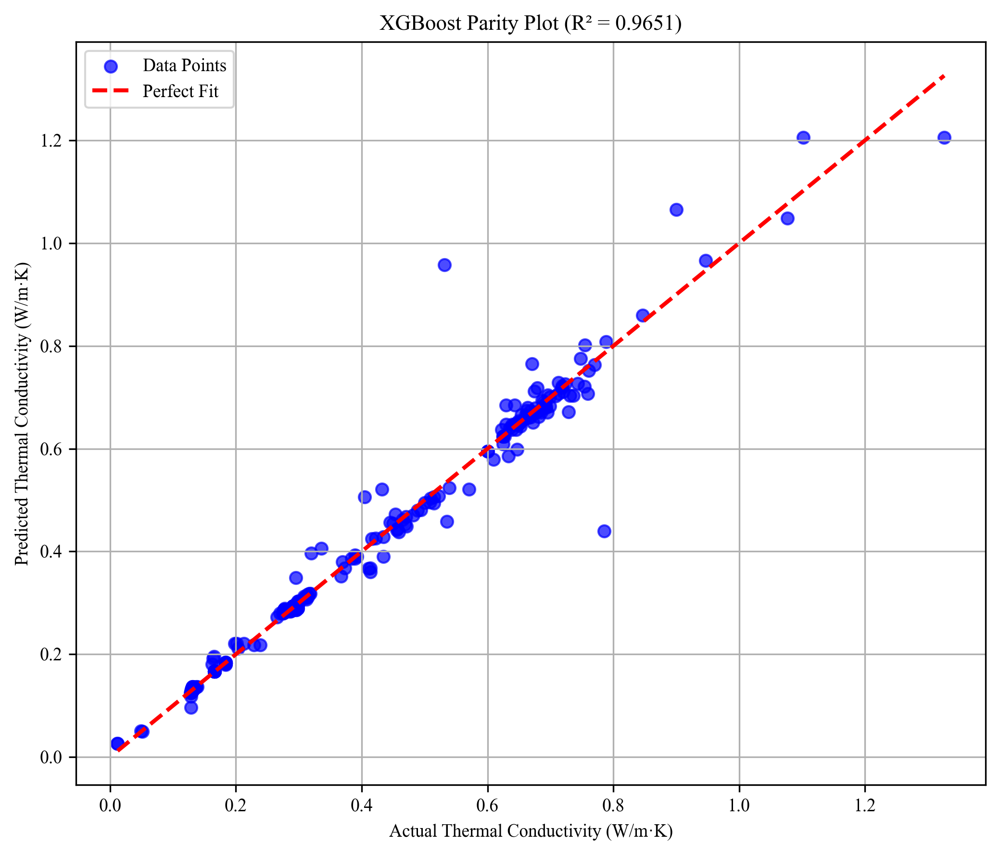

In [ ]:
# ================= 📊 PARITY PLOT (45° LINE) =================
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(7,6), dpi=300)

# Scatter points
plt.scatter(y_test, y_test_pred_xgb,
            color='blue',
            alpha=0.7,
            label='Data Points')

# Perfect fit line (45-degree line)
min_val = min(y_test.min(), y_test_pred_xgb.min())
max_val = max(y_test.max(), y_test_pred_xgb.max())

plt.plot([min_val, max_val],
         [min_val, max_val],
         color='red',
         linestyle='--',
         linewidth=2,
         label='Perfect Fit')

plt.xlabel("Actual Thermal Conductivity (W/m·K)")
plt.ylabel("Predicted Thermal Conductivity (W/m·K)")
plt.title(f"XGBoost Parity Plot (R² = {r2_test_xgb:.4f})")

plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

Residual plot XGB

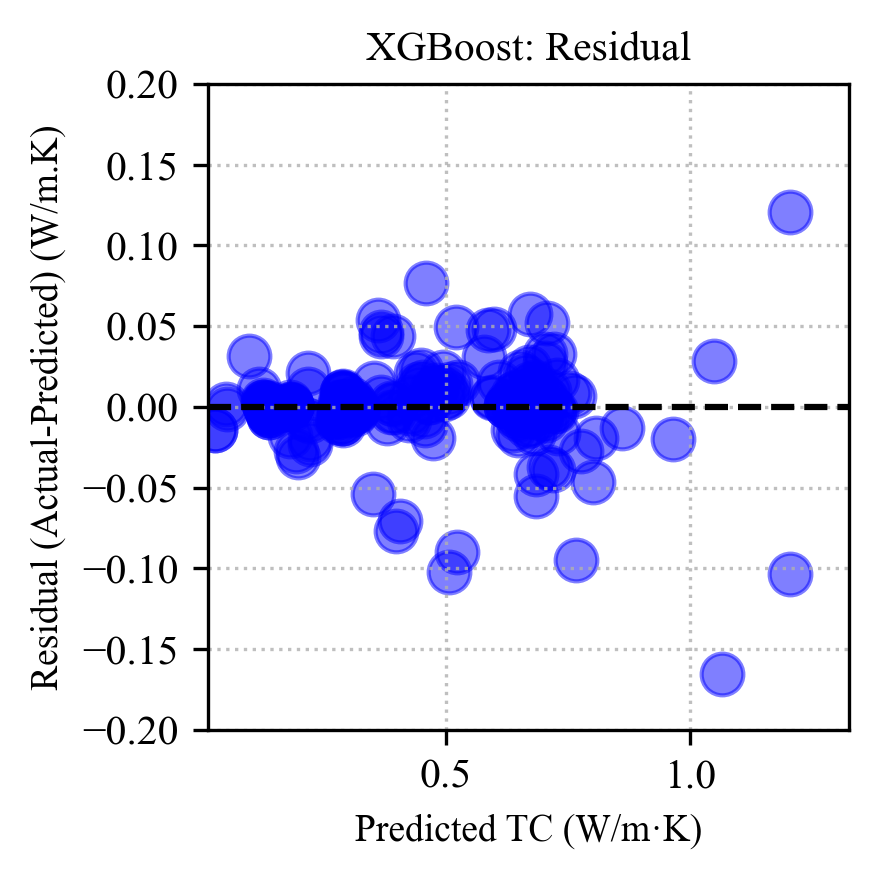

In [ ]:
# Plot Residuals
residuals_xgb = y_test - y_test_pred_xgb

plt.figure(figsize=(3, 3), dpi=300)

plt.scatter(y_test_pred_xgb, residuals_xgb, s=100, alpha=0.5, color='blue', marker='o')

# Zero reference line
plt.axhline(0, linestyle='--', color='black')

# ✅ FORCE SAME X-SCALE
plt.xlim(global_min, global_max)

# Set y-axis limits from -0.2 to 0.2
plt.ylim(-0.2, 0.2)

plt.xlabel("Predicted TC (W/m·K)", fontsize=9, fontproperties=times_font)
plt.ylabel("Residual (Actual-Predicted) (W/m.K)", fontsize=9, fontproperties=times_font)
plt.title("XGBoost: Residual", fontsize=9, fontproperties=times_font)

plt.xticks(fontsize=9, fontproperties=times_font)
plt.yticks(fontsize=9, fontproperties=times_font)

plt.grid(True, linestyle=':', alpha=0.8)
plt.tight_layout()

# Save the plot
#plt.savefig('/content/resdiual_xgboost.png', format='png', dpi=1200, transparent=True)
plt.show()

# BO Section

In [ ]:
pip install scikit-optimize

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.8/107.8 kB 3.6 MB/s eta 0:00:00


BO CODE

In [ ]:
# ===================== IMPORTS =====================
import numpy as np
from skopt.space import Real, Integer
from skopt import BayesSearchCV

from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# NOTE:
# This code assumes you already have:
#   1) preprocessor
#   2) X_train, X_test, y_train, y_test
#   3) xgb_pipeline = Pipeline([("preprocessor", preprocessor), ("model", XGBRegressor(...))])
# Make sure xgb_pipeline exists before running this cell.

# ===================== BAYESIAN SEARCH SPACE =====================
param_space = {
    "model__learning_rate": Real(0.01, 0.1, prior="uniform"),
    "model__n_estimators": Integer(100, 500),
    "model__max_depth": Integer(3, 12),
    "model__subsample": Real(0.6, 1.0, prior="uniform"),
    "model__colsample_bytree": Real(0.6, 1.0, prior="uniform"),
    "model__gamma": Real(0.0, 0.2, prior="uniform"),
    "model__reg_alpha": Real(0.0, 0.1, prior="uniform"),
    "model__reg_lambda": Real(0.0, 0.1, prior="uniform"),
}

# ===================== BAYES SEARCH =====================
bayes_opt_xgb = BayesSearchCV(
    estimator=xgb_pipeline,
    search_spaces=param_space,
    n_iter=40,
    cv=5,  # ✅ 5-fold CV inside BO
    scoring="neg_root_mean_squared_error",  # ✅ optimize RMSE directly (recommended)
    n_jobs=-1,
    random_state=42,
    verbose=1,
    refit=True
)

# ===================== RUN BAYESIAN OPTIMIZATION =====================
bayes_opt_xgb.fit(X_train, y_train)

print("\n✅ BEST HYPERPARAMETERS (BO–XGBoost)")
print(bayes_opt_xgb.best_params_)

# ===================== BEST ESTIMATOR =====================
best_xgb_bo = bayes_opt_xgb.best_estimator_

# ===================== 5-FOLD CV RMSE (Mean ± Std) =====================
cv_rmse_xgb_bo = cross_val_score(
    best_xgb_bo,
    X_train,
    y_train,
    cv=5,
    scoring="neg_root_mean_squared_error",
    n_jobs=-1
)
cv_rmse_xgb_bo = -cv_rmse_xgb_bo

print(
    f"\n📊 BO–XGBoost 5-Fold CV RMSE (Mean±Std): "
    f"{cv_rmse_xgb_bo.mean():.6f} ± {cv_rmse_xgb_bo.std(ddof=1):.6f}"
)

# ===================== FINAL TRAINING (FULL TRAIN SET) =====================
best_xgb_bo.fit(X_train, y_train)

# ===================== TEST PREDICTION =====================
y_test_pred_xgb_bo = best_xgb_bo.predict(X_test)

# ===================== TEST METRICS =====================
mse_xgb_bo  = mean_squared_error(y_test, y_test_pred_xgb_bo)
rmse_xgb_bo = np.sqrt(mse_xgb_bo)
mae_xgb_bo  = mean_absolute_error(y_test, y_test_pred_xgb_bo)

mape_xgb_bo = np.mean(
    np.abs((y_test - y_test_pred_xgb_bo) / np.where(y_test == 0, 1e-8, y_test))
) * 100

r2_xgb_bo = r2_score(y_test, y_test_pred_xgb_bo)

print("\n✅ BO–XGBoost: Test Performance")
print(f"Test MSE  : {mse_xgb_bo:.6f}")
print(f"Test RMSE : {rmse_xgb_bo:.6f}")
print(f"Test MAE  : {mae_xgb_bo:.6f}")
print(f"Test MAPE : {mape_xgb_bo:.2f} %")
print(f"Test R²   : {r2_xgb_bo:.6f}")

Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fi

Hyperparameter BO

In [ ]:
import pandas as pd

# Get best params
bo_params = bayes_opt_xgb.best_params_

# Remove "model__" prefix
bo_params_clean = {
    k.replace("model__", ""): v
    for k, v in bo_params.items()
}

# Create table
bo_params_df = pd.DataFrame(bo_params_clean, index=["BO-XGBoost"]).round(4)

print("\n✅ BO–XGBoost Optimized Hyperparameters Table")
print(bo_params_df)


✅ BO–XGBoost Optimized Hyperparameters Table
            colsample_bytree  gamma  learning_rate  max_depth  n_estimators  \
BO-XGBoost            0.7589    0.0         0.0465          3           275   

            reg_alpha  reg_lambda  subsample  
BO-XGBoost        0.0         0.1     0.9937  


Line Comparison plot BO

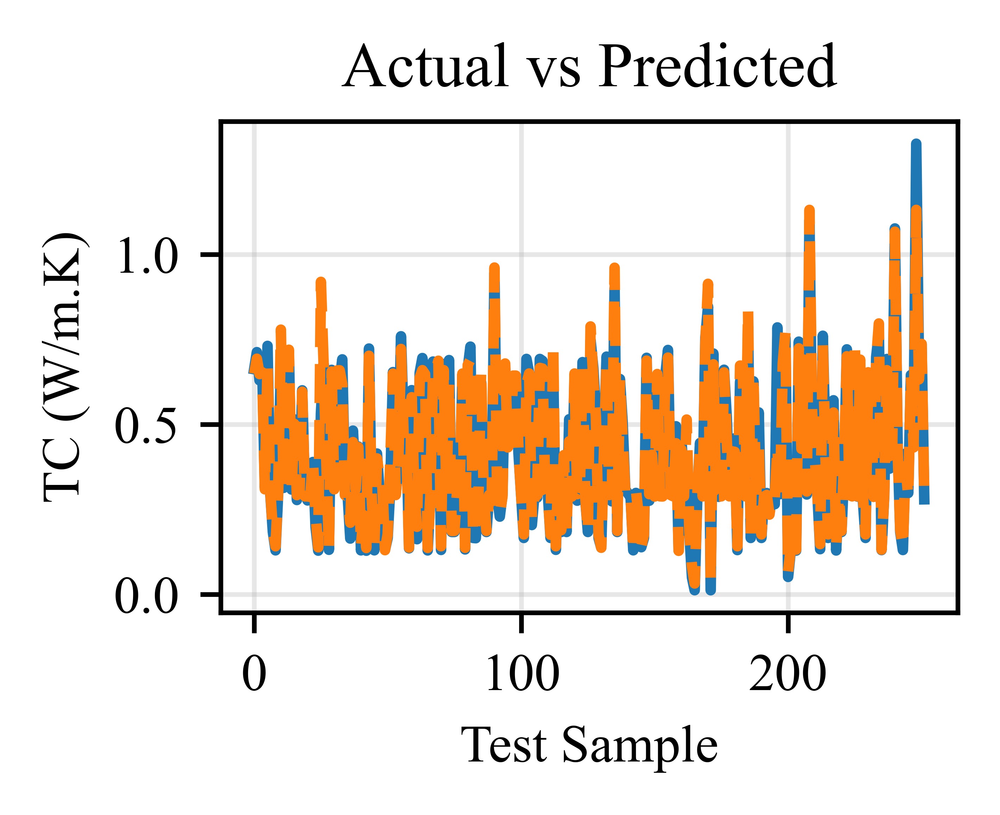

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# ---------- index ----------
idx = np.arange(len(y_test))

plt.figure(figsize=(2.5,2), dpi=1200)

# Actual
plt.plot(
    idx,
    y_test.values,
    linewidth=1.8,
    label="Actual"
)

# Predicted (BO-XGB)
plt.plot(
    idx,
    y_test_pred_xgb_bo,
    linewidth=1.8,
    linestyle="--",
    label="Predicted (BO-XGB)"
)

plt.xlabel("Test Sample")
plt.ylabel("TC (W/m.K)")
plt.title("Actual vs Predicted")

#plt.legend(frameon=False)
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

Scatter Plot BO

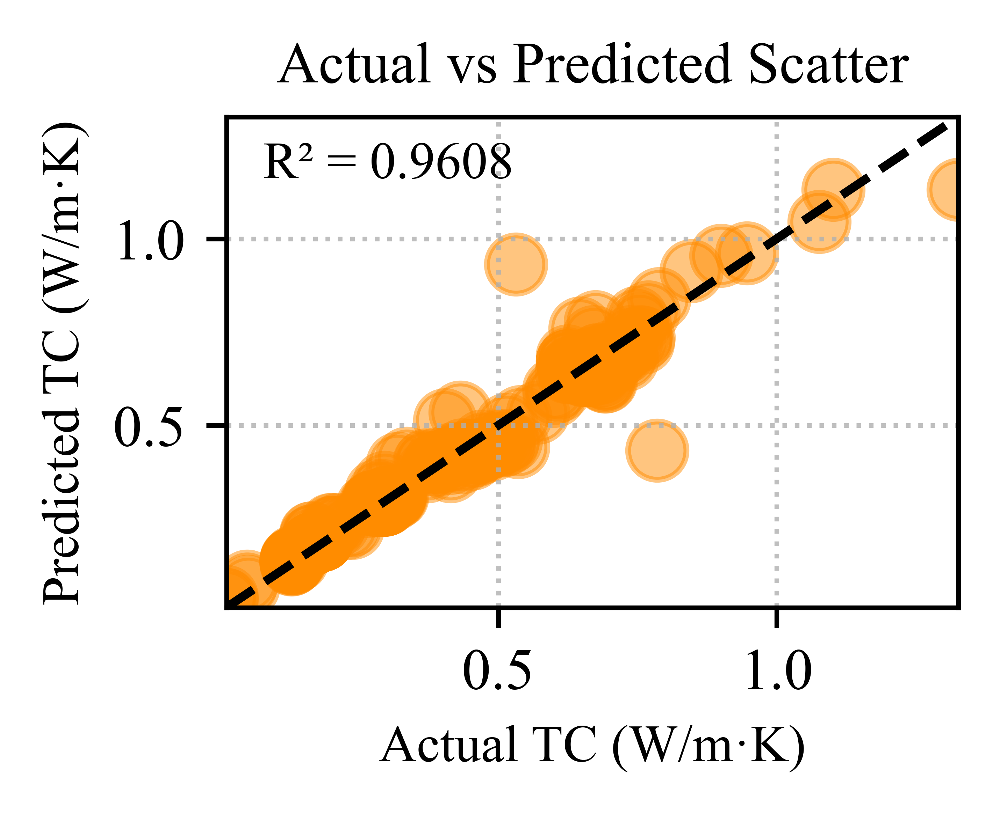

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# ================== Actual vs Predicted Plot ==================
# Predict on the test set
y_test_pred_bo = best_xgb_bo.predict(X_test)

# Global axis limits (for consistent scaling)
GLOBAL_MIN = min(y_test.min(), y_test_pred_bo.min())
GLOBAL_MAX = max(y_test.max(), y_test_pred_bo.max())

# Create Actual vs Predicted plot
plt.figure(figsize=(2.5, 2), dpi=1200)

# Scatter plot (orange color, similar to your example)
plt.scatter(
    y_test,
    y_test_pred_bo,
    s=100,
    alpha=0.5,
    color='darkorange'
)

# Perfect fit line (black dashed line)
plt.plot(
    [GLOBAL_MIN, GLOBAL_MAX],
    [GLOBAL_MIN, GLOBAL_MAX],
    linestyle='--',
    color='black'
)

# Fixed identical scaling for x and y axes
plt.xlim(GLOBAL_MIN, GLOBAL_MAX)
plt.ylim(GLOBAL_MIN, GLOBAL_MAX)

# Add labels, title, and R² annotation
plt.xlabel("Actual TC (W/m·K)", fontsize=9,fontproperties=times_font)
plt.ylabel("Predicted TC (W/m·K)", fontsize=9,fontproperties=times_font)
plt.title("Actual vs Predicted Scatter", fontsize=9,fontproperties=times_font)

# R² annotation (use the optimized model's R² score)
plt.text(
    0.05, 0.95,
    f"R² = {r2_xgb_bo:.4f}",
    transform=plt.gca().transAxes,
    verticalalignment='top',
    fontsize=9,fontproperties=times_font
)

plt.grid(True, linestyle=':', alpha=0.8)
plt.tight_layout()

plt.xticks(fontsize=9,fontproperties=times_font)
plt.yticks(fontsize=9,fontproperties=times_font)

# Save your figure as a vector-based PDF
#plt.savefig('/content/high_res_plot3.pdf', format='pdf', dpi=1200)
# Save plot as PNG (high DPI)
#plt.savefig("BO_XGBoost_Actual_vs_Predicted.png", dpi=1200)
plt.show()

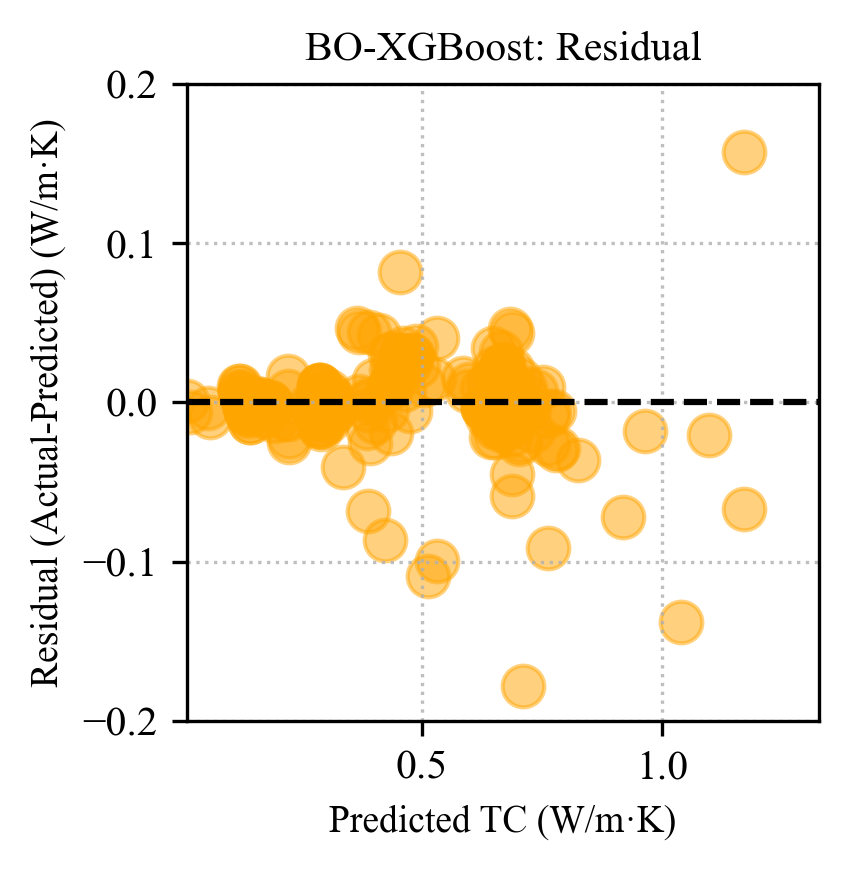

In [ ]:
# ================== Residual Plot ==================
# Calculate residuals
residuals_bo = y_test - y_test_pred_bo

# Create Residual plot
plt.figure(figsize=(3, 3), dpi=300)

# Scatter plot (orange color for residuals)
plt.scatter(
    y_test_pred_bo,
    residuals_bo,
    s=100,
    alpha=0.5,
    color='orange'
)

# Zero reference line (black dashed line)
plt.axhline(0, linestyle='--', color='black')

# Fixed identical x-scale
plt.xlim(GLOBAL_MIN, GLOBAL_MAX)
# Set y-axis limits from -0.2 to 0.2
plt.ylim(-0.2, 0.2)

# Add labels and title
plt.xlabel("Predicted TC (W/m·K)", fontsize=9,fontproperties=times_font)
plt.ylabel("Residual (Actual-Predicted) (W/m·K)", fontsize=9,fontproperties=times_font)
plt.title("BO-XGBoost: Residual", fontsize=9,fontproperties=times_font)

plt.xticks(fontsize=9,fontproperties=times_font)
plt.yticks(fontsize=9,fontproperties=times_font)
plt.grid(True, linestyle=':', alpha=0.8)
plt.tight_layout()

# Save plot as PNG (high DPI)
#plt.savefig('/content/high_res_plot4.pdf', format='pdf', dpi=1200)
#plt.savefig("BO_XGBoost_Residual.png", dpi=1200)
plt.show()

# PSO Section

In [ ]:
!pip install pyswarms

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.1/104.1 kB 4.2 MB/s eta 0:00:00


In [ ]:
!pip install pyswarms xgboost

In [ ]:
#from pyswarm import pso
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
import pandas as pd
from xgboost import XGBRegressor
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.impute import KNNImputer

PSO code

In [ ]:
# Assuming `df` is your DataFrame
# Make sure to replace it with your actual dataset
target_col = 'thermal_cond_W/m.K'
cat_cols = ['Nano_particle', 'base_fluid']

# Numeric columns = all except cats + target
num_cols = [c for c in df.columns if c not in cat_cols + [target_col]]

X = df[cat_cols + num_cols].copy()
y = df[target_col].copy()

# Remove rows with missing targets
mask = ~y.isna()
X = X[mask].reset_index(drop=True)
y = y[mask].reset_index(drop=True)

# 80:20 Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42
)

X_train = X_train.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)
X_test  = X_test.reset_index(drop=True)
y_test  = y_test.reset_index(drop=True)

# ===================== PREPROCESSING ======================
# Preprocessing for numeric and categorical columns
numeric_pipeline = Pipeline([
    ("imputer", KNNImputer(n_neighbors=5)),
    ("scaler", StandardScaler())
])

categorical_pipeline = Pipeline([
    ("onehot", OneHotEncoder(sparse_output=False, handle_unknown="ignore"))
])

preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_pipeline, num_cols),
        ("cat", categorical_pipeline, cat_cols)
    ]
)

# ===================== DEFINE OBJECTIVE FUNCTION =====================
from sklearn.metrics import mean_squared_error, r2_score
from xgboost import XGBRegressor
from sklearn.model_selection import KFold

def objective_function(params):
    """
    PSO objective: minimize mean 5-fold CV RMSE
    """
    n_particles = params.shape[0]
    scores = np.zeros(n_particles)

    for i in range(n_particles):

        learning_rate = params[i, 0]
        n_estimators = int(params[i, 1])
        max_depth = int(params[i, 2])
        subsample = params[i, 3]
        colsample_bytree = params[i, 4]
        gamma = params[i, 5]
        reg_alpha = params[i, 6]
        reg_lambda = params[i, 7]

        model = XGBRegressor(
            random_state=42,
            objective="reg:squarederror",
            eval_metric="rmse",
            learning_rate=learning_rate,
            n_estimators=n_estimators,
            max_depth=max_depth,
            subsample=subsample,
            colsample_bytree=colsample_bytree,
            gamma=gamma,
            reg_alpha=reg_alpha,
            reg_lambda=reg_lambda
        )

        pipe = Pipeline([
            ("preprocessor", preprocessor),
            ("model", model)
        ])

        kf = KFold(n_splits=5, shuffle=True, random_state=42)

        rmse_scores = []

        for tr_idx, va_idx in kf.split(X_train):
            pipe.fit(X_train.iloc[tr_idx], y_train.iloc[tr_idx])
            pred = pipe.predict(X_train.iloc[va_idx])

            rmse = np.sqrt(mean_squared_error(y_train.iloc[va_idx], pred))
            rmse_scores.append(rmse)

        scores[i] = np.mean(rmse_scores)   # minimize RMSE

    return scores

# ===================== DEFINE PSO SEARCH SPACE =====================
import pyswarms as ps

# Define the lower and upper bounds for each hyperparameter
lb = [0.01, 100, 3, 0.6, 0.6, 0, 0, 0]  # Lower bounds for each parameter
ub = [0.1, 500, 12, 1.0, 1.0, 0.2, 0.1, 0.1]  # Upper bounds for each parameter

# ===================== RUN PSO =====================
best_cost, best_pos = ps.single.GlobalBestPSO(
    n_particles=10,
    dimensions=8,
    options={'c1': 1.5, 'c2': 1.5, 'w': 0.7},
    bounds=(np.array(lb), np.array(ub))
).optimize(objective_function, iters=20)

# Extract the best hyperparameters directly from best_pos
learning_rate_opt = float(best_pos[0])
n_estimators_opt = int(best_pos[1])    # Convert to integer
max_depth_opt = int(best_pos[2])       # Convert to integer
subsample_opt = float(best_pos[3])     # Ensure it's a Python float
colsample_bytree_opt = float(best_pos[4])  # Ensure it's a Python float
gamma_opt = float(best_pos[5])         # Ensure it's a Python float
reg_alpha_opt = float(best_pos[6])     # Ensure it's a Python float
reg_lambda_opt = float(best_pos[7])    # Ensure it's a Python float

# ===================== RETRAIN USING OPTIMAL PARAMETERS =====================
best_xgb_model = XGBRegressor(
    random_state=42,
    objective="reg:squarederror",
    eval_metric="rmse",
    learning_rate=learning_rate_opt,
    n_estimators=n_estimators_opt,
    max_depth=max_depth_opt,
    subsample=subsample_opt,
    colsample_bytree=colsample_bytree_opt,
    gamma=gamma_opt,
    reg_alpha=reg_alpha_opt,
    reg_lambda=reg_lambda_opt
)

# Full pipeline: preprocessing + model
best_xgb_pipeline = Pipeline([
    ("preprocessor", preprocessor),
    ("model", best_xgb_model)
])

# Retrain on the full training data with optimal hyperparameters
best_xgb_pipeline.fit(X_train, y_train)

# ==================== FINAL TEST EVALUATION =======================
# Predict on the test set
y_test_pred_xgb_opt = best_xgb_pipeline.predict(X_test)

# Compute performance metrics
mse_xgb_opt = mean_squared_error(y_test, y_test_pred_xgb_opt)
rmse_xgb_opt = np.sqrt(mse_xgb_opt)
mae_xgb_opt  = mean_absolute_error(y_test, y_test_pred_xgb_opt)

# MAPE with zero-safe denominator
mape_xgb_opt = np.mean(
    np.abs((y_test - y_test_pred_xgb_opt) / np.where(y_test == 0, 1e-8, y_test))
) * 100

r2_xgb_opt = r2_score(y_test, y_test_pred_xgb_opt)

# Print the final evaluation metrics after PSO optimization
print("\n✅ FINAL TEST VALIDATION AFTER PSO (XGBoost)")
print(f"PSO-XGBoost MSE  : {mse_xgb_opt:.6f}")
print(f"PSO-XGBoost RMSE : {rmse_xgb_opt:.6f}")
print(f"PSO-XGBoost MAE  : {mae_xgb_opt:.6f}")
print(f"PSO-XGBoost MAPE : {mape_xgb_opt:.2f} %")
print(f"PSO-XGBoost R²   : {r2_xgb_opt:.6f}")

# ===================== 5-Fold CV RMSE (Mean±Std) =====================
from sklearn.model_selection import cross_val_score

cv_rmse_xgb_opt = cross_val_score(
    best_xgb_pipeline,
    X_train,
    y_train,
    cv=5,
    scoring="neg_root_mean_squared_error",
    n_jobs=-1
)

cv_rmse_xgb_opt = -cv_rmse_xgb_opt

print(
    f"\n📊 PSO-XGBoost 5-Fold CV RMSE (Mean±Std): "
    f"{cv_rmse_xgb_opt.mean():.6f} ± {cv_rmse_xgb_opt.std(ddof=1):.6f}"
)

2026-02-05 15:06:15,021 - pyswarms.single.global_best - INFO - Optimize for 20 iters with {'c1': 1.5, 'c2': 1.5, 'w': 0.7}
pyswarms.single.global_best: 100%|██████████|20/20, best_cost=0.0398
2026-02-05 15:08:50,743 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.039756214822309656, best pos: [2.06178434e-02 4.94492432e+02 5.93071635e+00 7.56783956e-01
 6.04987112e-01 3.10635483e-03 1.55380797e-02 5.06451381e-03]



✅ FINAL TEST VALIDATION AFTER PSO (XGBoost)
PSO-XGBoost MSE  : 0.001562
PSO-XGBoost RMSE : 0.039526
PSO-XGBoost MAE  : 0.019639
PSO-XGBoost MAPE : 7.23 %
PSO-XGBoost R²   : 0.969779

📊 PSO-XGBoost 5-Fold CV RMSE (Mean±Std): 0.039186 ± 0.009368


Hyperparameter PSO

In [ ]:
import pandas as pd

params_dict = {
    "learning_rate": learning_rate_opt,
    "n_estimators": n_estimators_opt,
    "max_depth": max_depth_opt,
    "subsample": subsample_opt,
    "colsample_bytree": colsample_bytree_opt,
    "gamma": gamma_opt,
    "reg_alpha": reg_alpha_opt,
    "reg_lambda": reg_lambda_opt
}

params_df = pd.DataFrame(params_dict, index=["PSO-XGBoost"])

print("\n✅ Optimized Hyperparameters Table")
print(params_df)


✅ Optimized Hyperparameters Table
             learning_rate  n_estimators  max_depth  subsample  \
PSO-XGBoost       0.020618           494          5   0.756784   

             colsample_bytree     gamma  reg_alpha  reg_lambda  
PSO-XGBoost          0.604987  0.003106   0.015538    0.005065  


Line Comparison Plot

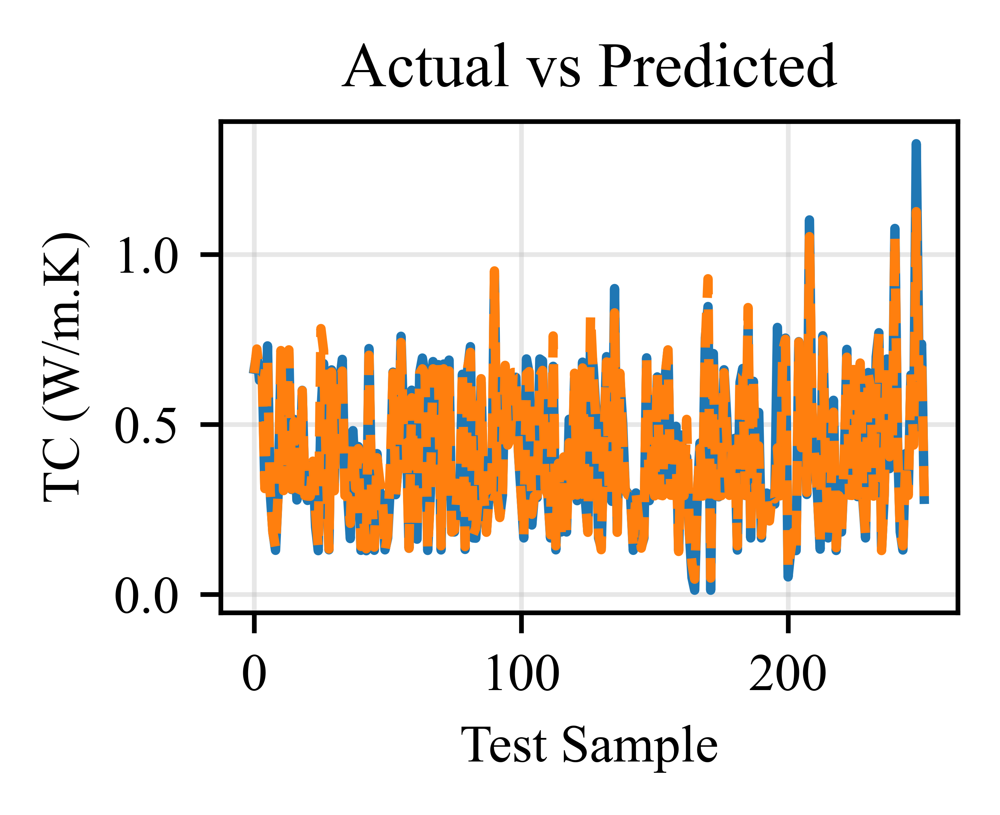

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# ================= INDEX =================
idx = np.arange(len(y_test))

plt.figure(figsize=(2.5,2), dpi=1200)

# -------- ACTUAL --------
plt.plot(
    idx,
    y_test.values,
    linewidth=1.6,
    label="Actual"
)

# -------- PREDICTED --------
plt.plot(
    idx,
    y_test_pred_xgb_opt,
    linewidth=1.6,
    linestyle="--",
    label="Predicted"
)

# ================= LABELS =================
plt.xlabel("Test Sample")
plt.ylabel("TC (W/m.K)")
plt.title("Actual vs Predicted")

# Optional legend
#plt.legend(frameon=False)

plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

Scatter Plot PSO

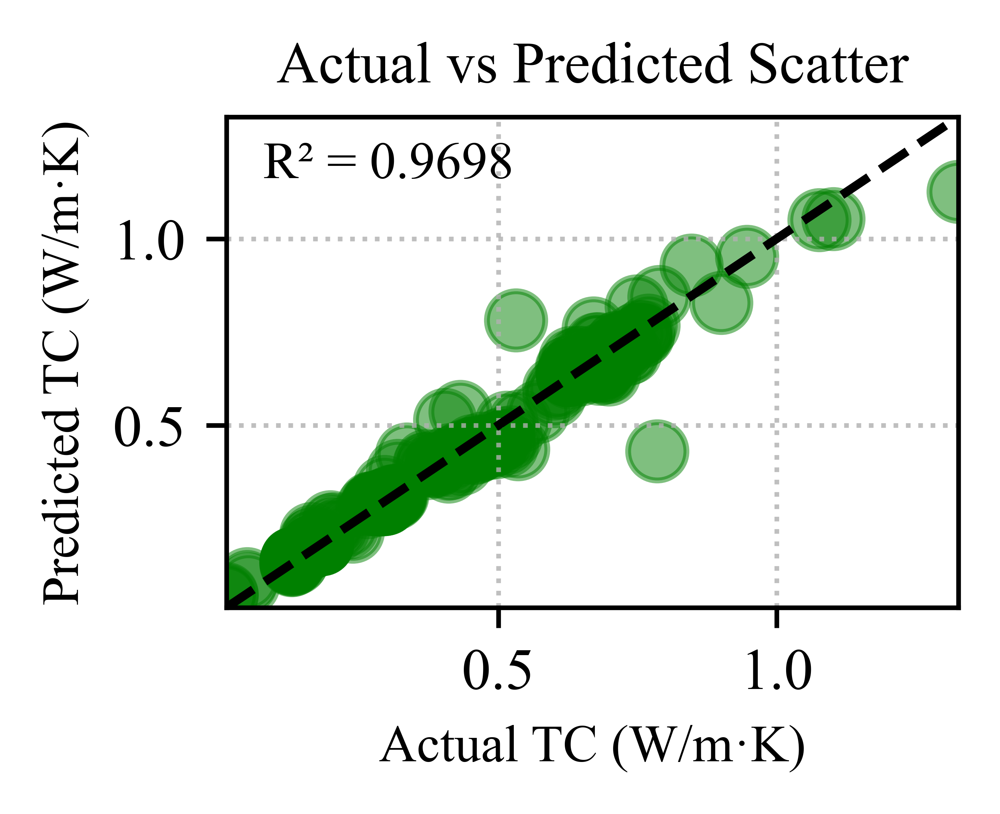

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# ===================== ACTUAL vs PREDICTED =====================

# Predict on the test set using the PSO-optimized model
y_test_pred_xgb_pso = best_xgb_pipeline.predict(X_test)

# Define global axis limits for consistent scaling in both plots
GLOBAL_MIN = min(y_test.min(), y_test_pred_xgb_pso.min())
GLOBAL_MAX = max(y_test.max(), y_test_pred_xgb_pso.max())

# Create Actual vs Predicted plot
plt.figure(figsize=(2.5,2), dpi=1200)

# Scatter plot of actual vs predicted values
plt.scatter(
    y_test,
    y_test_pred_xgb_pso,
    s=100,
    alpha=0.5,
    color='green'
)

# Perfect fit line (black dashed line)
plt.plot(
    [GLOBAL_MIN, GLOBAL_MAX],
    [GLOBAL_MIN, GLOBAL_MAX],
    linestyle='--',
    color='black'
)

# Set the identical scaling for both axes
plt.xlim(GLOBAL_MIN, GLOBAL_MAX)
plt.ylim(GLOBAL_MIN, GLOBAL_MAX)

# Labels, title, and R² annotation
plt.xlabel("Actual TC (W/m·K)", fontsize=9, fontproperties=times_font)
plt.ylabel("Predicted TC (W/m·K)", fontsize=9, fontproperties=times_font)
plt.title("Actual vs Predicted Scatter", fontsize=9, fontproperties=times_font)

# R² annotation
plt.text(
    0.05, 0.95,
    f"R² = {r2_xgb_opt:.4f}",
    transform=plt.gca().transAxes,
    verticalalignment='top',
    fontsize=9, fontproperties=times_font
)

# Grid and layout
plt.grid(True, linestyle=':', alpha=0.8)
plt.tight_layout()
plt.xticks(fontsize=9, fontproperties=times_font)
plt.yticks(fontsize=9, fontproperties=times_font)
# Save the plot as a high-quality PNG image
#plt.savefig('/content/high_res_plot5.pdf', format='pdf', dpi=1200)
#plt.savefig("PSO_XGBoost_Actual_vs_Predicted.png", dpi=1200)
plt.show()

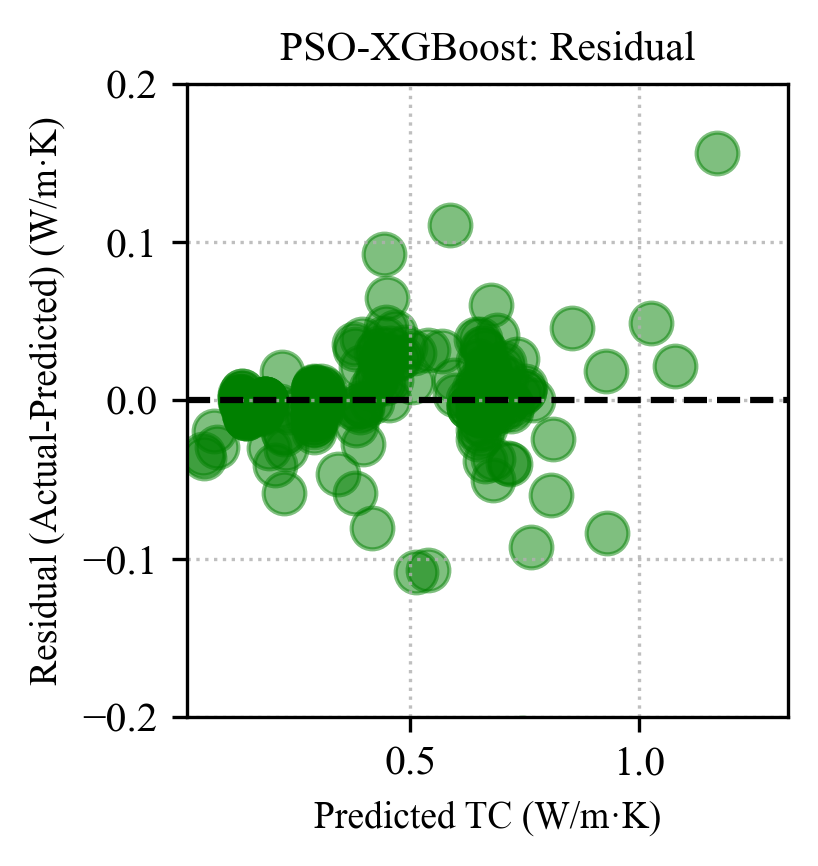

In [ ]:

# ===================== RESIDUAL PLOT =====================

# Calculate residuals (differences between actual and predicted values)
residuals_xgb_pso = y_test - y_test_pred_xgb_pso

# Create Residual plot
plt.figure(figsize=(3,3), dpi=300)

# Scatter plot of residuals vs predicted values
plt.scatter(
    y_test_pred_xgb_pso,
    residuals_xgb_pso,
    s=100,
    alpha=0.5,
    color='green'
)

# Zero reference line (black dashed line)
plt.axhline(0, linestyle='--', color='black')

# Set the identical scaling for the x-axis
plt.xlim(GLOBAL_MIN, GLOBAL_MAX)

# Set y-axis limits from -0.2 to 0.2
plt.ylim(-0.2, 0.2)
# Labels and title
plt.xlabel("Predicted TC (W/m·K)", fontsize=9, fontproperties=times_font)
plt.ylabel("Residual (Actual-Predicted) (W/m·K)", fontsize=9, fontproperties=times_font)
plt.title("PSO-XGBoost: Residual", fontsize=9, fontproperties=times_font)

# Grid and layout
plt.grid(True, linestyle=':', alpha=0.8)
plt.tight_layout()
plt.xticks(fontsize=9, fontproperties=times_font)
plt.yticks(fontsize=9, fontproperties=times_font)
#plt.savefig('/content/high_res_plot6.pdf', format='pdf', dpi=1200)
# Save the residual plot as a high-quality PNG image
#plt.savefig("PSO_XGBoost_Residual.png", dpi=1200)
plt.show()

# GWO Section

In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from xgboost import XGBRegressor
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.impute import KNNImputer

# ===================== DATA PREPARATION ====================
target_col = 'thermal_cond_W/m.K'
cat_cols = ['Nano_particle', 'base_fluid']

# Numeric columns = all except cats + target
num_cols = [c for c in df.columns if c not in cat_cols + [target_col]]

X = df[cat_cols + num_cols].copy()
y = df[target_col].copy()

# Remove rows with missing targets
mask = ~y.isna()
X = X[mask].reset_index(drop=True)
y = y[mask].reset_index(drop=True)

# 80:20 Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)
X_train = X_train.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)
X_test  = X_test.reset_index(drop=True)
y_test  = y_test.reset_index(drop=True)

# ===================== PREPROCESSING ======================
numeric_pipeline = Pipeline([("imputer", KNNImputer(n_neighbors=5)), ("scaler", StandardScaler())])

# Handling categorical variables with OneHotEncoder
categorical_pipeline = Pipeline([("onehot", OneHotEncoder(sparse_output=False, handle_unknown="ignore"))])

preprocessor = ColumnTransformer(
    transformers=[("num", numeric_pipeline, num_cols), ("cat", categorical_pipeline, cat_cols)]
)

# ===================== GWO IMPLEMENTATION =====================

def objective_function(params):
    """
    GWO objective: minimize mean 5-fold CV RMSE
    """

    learning_rate, n_estimators, max_depth, subsample, colsample_bytree, gamma, reg_alpha, reg_lambda = params

    model = XGBRegressor(
        random_state=42,
        objective="reg:squarederror",
        eval_metric="rmse",
        learning_rate=float(learning_rate),
        n_estimators=int(n_estimators),
        max_depth=int(max_depth),
        subsample=float(subsample),
        colsample_bytree=float(colsample_bytree),
        gamma=float(gamma),
        reg_alpha=float(reg_alpha),
        reg_lambda=float(reg_lambda)
    )

    pipe = Pipeline([
        ("preprocessor", preprocessor),
        ("model", model)
    ])

    kf = KFold(n_splits=5, shuffle=True, random_state=42)

    rmse_scores = []

    for tr_idx, va_idx in kf.split(X_train):
        pipe.fit(X_train.iloc[tr_idx], y_train.iloc[tr_idx])
        pred = pipe.predict(X_train.iloc[va_idx])

        rmse = np.sqrt(mean_squared_error(y_train.iloc[va_idx], pred))
        rmse_scores.append(rmse)

    return np.mean(rmse_scores)   # minimize RMSE

# ===================== GWO ALGORITHM =====================

class GreyWolfOptimizer:
    def __init__(self, function, lower_bounds, upper_bounds, num_wolves, max_iter):
        self.function = function  # Objective function
        self.lower_bounds = np.array(lower_bounds)  # Lower bounds for hyperparameters
        self.upper_bounds = np.array(upper_bounds)  # Upper bounds for hyperparameters
        self.num_wolves = num_wolves  # Number of wolves in the swarm
        self.max_iter = max_iter  # Maximum iterations
        self.alpha = None  # Alpha wolf
        self.beta = None  # Beta wolf
        self.delta = None  # Delta wolf
        self.alpha_position = None
        self.beta_position = None
        self.delta_position = None
        self.positions = np.random.uniform(self.lower_bounds, self.upper_bounds, (self.num_wolves, len(self.lower_bounds)))

    def optimize(self):
        for t in range(self.max_iter):
            # Calculate fitness for each wolf
            fitness = np.apply_along_axis(self.function, 1, self.positions)

            # Update Alpha, Beta, and Delta wolves
            sorted_indices = np.argsort(fitness)
            self.alpha_position = self.positions[sorted_indices[0]]
            self.beta_position = self.positions[sorted_indices[1]]
            self.delta_position = self.positions[sorted_indices[2]]

            # Update the positions of the wolves based on the GWO algorithm
            a = 2 - t * (2 / self.max_iter)  # Decrease linearly from 2 to 0
            r1 = np.random.rand(self.num_wolves, len(self.lower_bounds))
            r2 = np.random.rand(self.num_wolves, len(self.lower_bounds))

            # Update positions of the wolves based on the alpha, beta, delta wolves
            for i in range(self.num_wolves):
                A1 = 2 * a * r1[i] - a
                C1 = 2 * r2[i]
                D_alpha = abs(C1 * self.alpha_position - self.positions[i])
                X1 = self.alpha_position - A1 * D_alpha

                A2 = 2 * a * r1[i] - a
                C2 = 2 * r2[i]
                D_beta = abs(C2 * self.beta_position - self.positions[i])
                X2 = self.beta_position - A2 * D_beta

                A3 = 2 * a * r1[i] - a
                C3 = 2 * r2[i]
                D_delta = abs(C3 * self.delta_position - self.positions[i])
                X3 = self.delta_position - A3 * D_delta

                # Update the current position
                self.positions[i] = (X1 + X2 + X3) / 3

                # Ensure positions stay within bounds
                self.positions[i] = np.clip(self.positions[i], self.lower_bounds, self.upper_bounds)

        # Return the best position found (the optimal parameters)
        return self.alpha_position

# ===================== DEFINE BOUNDS =====================

lb = [0.01, 100, 3, 0.6, 0.6, 0, 0, 0]  # Lower bounds for each parameter
ub = [0.1, 500, 12, 1.0, 1.0, 0.2, 0.1, 0.1]  # Upper bounds for each parameter

# ===================== RUN GWO =====================
gwo = GreyWolfOptimizer(
    function=objective_function,  # Objective function
    lower_bounds=lb,  # Lower bounds for hyperparameters
    upper_bounds=ub,  # Upper bounds for hyperparameters
    num_wolves=10,  # Number of wolves in the swarm
    max_iter=20  # Maximum iterations
)

best_params = gwo.optimize()

# ===================== RETRAIN USING OPTIMAL PARAMETERS =====================

# Extract the optimal parameters
learning_rate_opt, n_estimators_opt, max_depth_opt, subsample_opt, colsample_bytree_opt, gamma_opt, reg_alpha_opt, reg_lambda_opt = best_params

best_xgb_model = XGBRegressor(
    random_state=42,
    objective="reg:squarederror",
    eval_metric="rmse",
    learning_rate=learning_rate_opt,
    n_estimators=int(n_estimators_opt),
    max_depth=int(max_depth_opt),
    subsample=subsample_opt,
    colsample_bytree=colsample_bytree_opt,
    gamma=gamma_opt,
    reg_alpha=reg_alpha_opt,
    reg_lambda=reg_lambda_opt
)

best_xgb_pipeline = Pipeline([("preprocessor", preprocessor), ("model", best_xgb_model)])

# Retrain on the full training data
best_xgb_pipeline.fit(X_train, y_train)

# ===================== 5-Fold Cross-Validation RMSE (Mean ± Std) after Retraining =====================
def calculate_5fold_cv_rmse(model, X, y, cv=5):
    kf = KFold(n_splits=cv, shuffle=True, random_state=42)
    rmse_scores = []  # List to store RMSE for each fold

    for train_idx, val_idx in kf.split(X):
        X_train_fold = X.iloc[train_idx]
        X_val_fold = X.iloc[val_idx]
        y_train_fold = y.iloc[train_idx]
        y_val_fold = y.iloc[val_idx]

        model.fit(X_train_fold, y_train_fold)
        y_val_pred = model.predict(X_val_fold)

        rmse = np.sqrt(mean_squared_error(y_val_fold, y_val_pred))
        rmse_scores.append(rmse)

    rmse_mean = np.mean(rmse_scores)
    rmse_std = np.std(rmse_scores)
    return rmse_mean, rmse_std

rmse_mean, rmse_std = calculate_5fold_cv_rmse(best_xgb_pipeline, X_train, y_train)

print("\n✅ 5-Fold CV RMSE (Mean ± Std) after Retraining on Full Data")
print(f"Mean RMSE: {rmse_mean:.6f}")
print(f"Std RMSE: {rmse_std:.6f}")

# ===================== FINAL TEST EVALUATION =====================

y_test_pred_xgb_opt = best_xgb_pipeline.predict(X_test)

mse_xgb_opt = mean_squared_error(y_test, y_test_pred_xgb_opt)
rmse_xgb_opt = np.sqrt(mse_xgb_opt)
mae_xgb_opt  = mean_absolute_error(y_test, y_test_pred_xgb_opt)

mape_xgb_opt = np.mean(np.abs((y_test - y_test_pred_xgb_opt) / np.where(y_test == 0, 1e-8, y_test))) * 100
r2_xgb_opt = r2_score(y_test, y_test_pred_xgb_opt)

print(f"\n✅ GWO-XGBoost Final Test MSE  : {mse_xgb_opt:.6f}")
print(f"✅ GWO-XGBoost Final Test RMSE : {rmse_xgb_opt:.6f}")
print(f"✅ GWO-XGBoost Final Test MAE  : {mae_xgb_opt:.6f}")
print(f"✅ GWO-XGBoost Final Test MAPE : {mape_xgb_opt:.2f} %")
print(f"✅ GWO-XGBoost Final Test R²   : {r2_xgb_opt:.6f}")


✅ 5-Fold CV RMSE (Mean ± Std) after Retraining on Full Data
Mean RMSE: 0.032804
Std RMSE: 0.004006

✅ GWO-XGBoost Final Test MSE  : 0.001181
✅ GWO-XGBoost Final Test RMSE : 0.034366
✅ GWO-XGBoost Final Test MAE  : 0.014648
✅ GWO-XGBoost Final Test MAPE : 3.66 %
✅ GWO-XGBoost Final Test R²   : 0.977155


In [ ]:
import pandas as pd

gwo_params_dict = {
    "learning_rate": float(learning_rate_opt),
    "n_estimators": int(n_estimators_opt),
    "max_depth": int(max_depth_opt),
    "subsample": float(subsample_opt),
    "colsample_bytree": float(colsample_bytree_opt),
    "gamma": float(gamma_opt),
    "reg_alpha": float(reg_alpha_opt),
    "reg_lambda": float(reg_lambda_opt)
}

gwo_params_df = pd.DataFrame(gwo_params_dict, index=["GWO-XGBoost"]).round(4)

print("\n✅ GWO–XGBoost Optimized Hyperparameters Table")
print(gwo_params_df)


✅ GWO–XGBoost Optimized Hyperparameters Table
             learning_rate  n_estimators  max_depth  subsample  \
GWO-XGBoost         0.0856           500          3     0.8777   

             colsample_bytree  gamma  reg_alpha  reg_lambda  
GWO-XGBoost            0.6601    0.0     0.0186      0.0106  


Line Comparison plot GWO

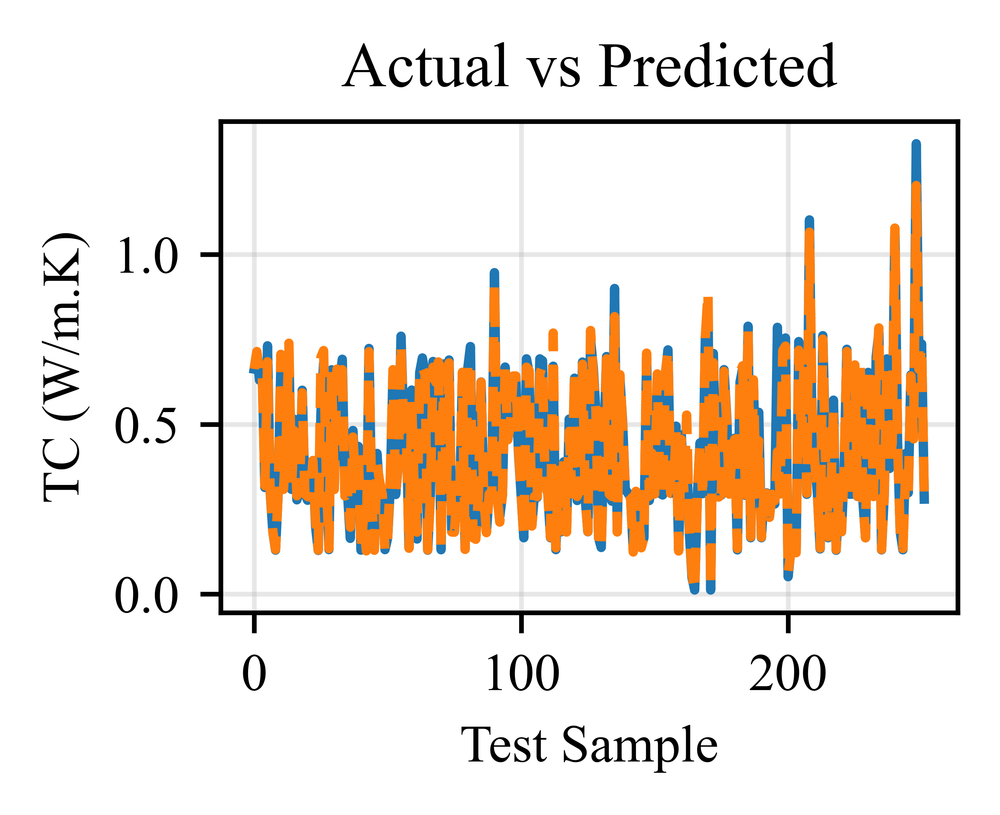

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# ================= INDEX =================
idx = np.arange(len(y_test))

plt.figure(figsize=(2.5, 2), dpi=1200)

# -------- ACTUAL --------
plt.plot(
    idx,
    y_test.values,
    linewidth=1.6,
    label="Actual"
)

# -------- PREDICTED (GWO-XGB) --------
plt.plot(
    idx,
    y_test_pred_xgb_opt,
    linewidth=1.6,
    linestyle="--",
    label="Predicted (GWO-XGB)"
)

# ================= LABELS =================
plt.xlabel("Test Sample")
plt.ylabel("TC (W/m.K)")
plt.title("Actual vs Predicted")

#plt.legend(frameon=False)
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


Scatter Plot GWO

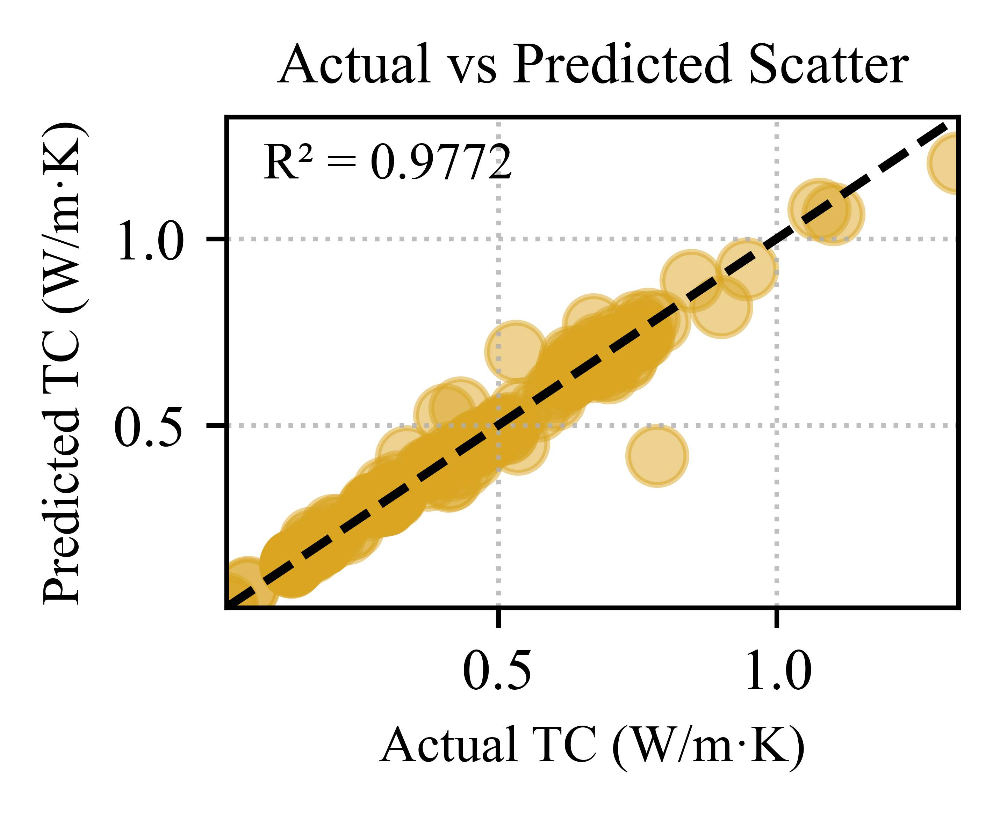

In [ ]:
import matplotlib.pyplot as plt

# ===================== ACTUAL vs PREDICTED PLOT =====================
plt.figure(figsize=(2.5,2), dpi=1200)
plt.scatter(y_test, y_test_pred_xgb_opt, color='goldenrod', alpha=0.5, s=100)

# Perfect fit line
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], linestyle='--', color='black')

# Calculate R² value
r2_gwo = r2_score(y_test, y_test_pred_xgb_opt)

# Labels and Title
plt.xlabel("Actual TC (W/m·K)", fontsize=9,fontproperties=times_font)
plt.ylabel("Predicted TC (W/m·K)", fontsize=9,fontproperties=times_font)
plt.title("Actual vs Predicted Scatter", fontsize=9,fontproperties=times_font)

# R² annotation
plt.text(
    0.05, 0.95,
    f"R² = {r2_gwo:.4f}",
    transform=plt.gca().transAxes,
    verticalalignment='top',
    fontsize=9,fontproperties=times_font
)
# Set the identical scaling for the x-axis
#plt.xlim(GLOBAL_MIN, GLOBAL_MAX)

# ✅ FORCE SAME SCALE
plt.xlim(global_min, global_max)
plt.ylim(global_min, global_max)


# Grid and formatting
plt.grid(True, linestyle=':', alpha=0.8)
plt.tight_layout()
plt.xticks(fontsize=9,fontproperties=times_font)
plt.yticks(fontsize=9,fontproperties=times_font)
# Display plot
#plt.savefig("GWO_XGBoost_actual vs predicted1.png", dpi=1200)
plt.show()

In [ ]:
GLOBAL_MIN = min(y_test_pred_xgb_opt)  # or a manually set value
GLOBAL_MAX = max(y_test_pred_xgb_opt)  # or a manually set value

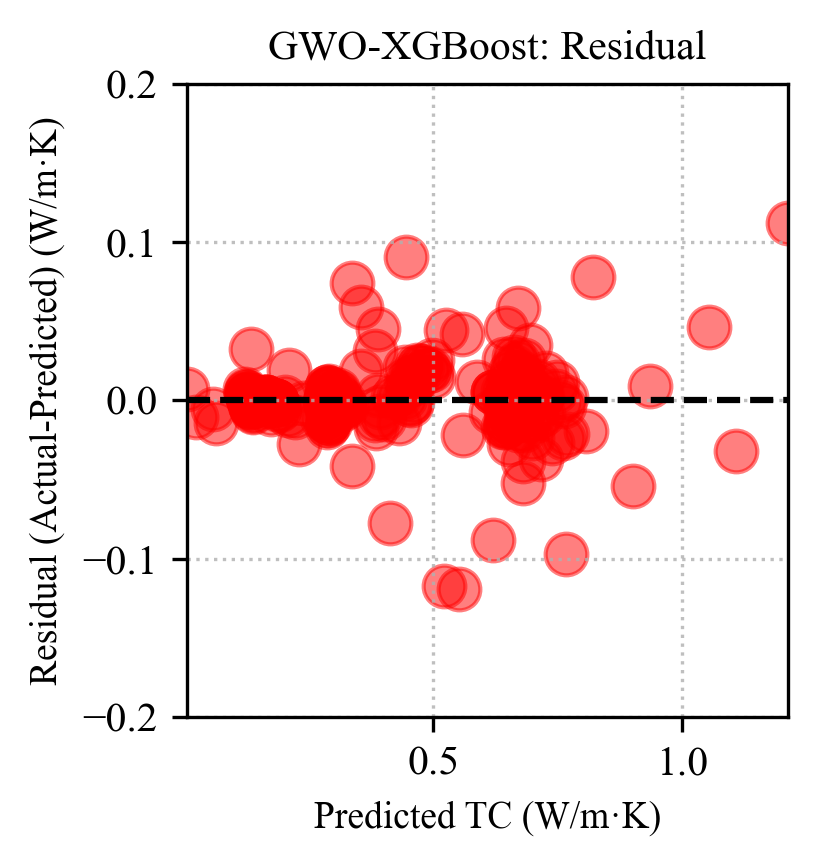

In [ ]:

# ===================== RESIDUAL PLOT =====================
residuals_xgb_opt = y_test - y_test_pred_xgb_opt

plt.figure(figsize=(3,3), dpi=300)
plt.scatter(y_test_pred_xgb_opt, residuals_xgb_opt, color='red', alpha=0.5, s=100)

# Zero reference line
plt.axhline(0, linestyle='--', color='black')

# Labels and Title
plt.xlabel("Predicted TC (W/m·K)", fontsize=9,fontproperties=times_font)
plt.ylabel("Residual (Actual-Predicted) (W/m·K)", fontsize=9,fontproperties=times_font)
plt.title("GWO-XGBoost: Residual", fontsize=9,fontproperties=times_font)

# Set the identical scaling for the x-axis
plt.xlim(GLOBAL_MIN, GLOBAL_MAX)
# Set y-axis limits from -0.2 to 0.2
plt.ylim(-0.2, 0.2)

# Grid and formatting
plt.grid(True, linestyle=':', alpha=0.8)
plt.tight_layout()
plt.xticks(fontsize=9,fontproperties=times_font)
plt.yticks(fontsize=9,fontproperties=times_font)

#plt.savefig("GWO_XGBoost_Residual1.png", dpi=1200)
# Display plot
plt.show()

# WOA section

In [ ]:
import numpy as np
import pandas as pd

from sklearn.model_selection import train_test_split, KFold
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.impute import KNNImputer
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from xgboost import XGBRegressor

# ===================== DATA PREPARATION =====================
target_col = 'thermal_cond_W/m.K'
cat_cols = ['Nano_particle', 'base_fluid']

num_cols = [c for c in df.columns if c not in cat_cols + [target_col]]

X = df[cat_cols + num_cols].copy()
y = df[target_col].copy()

mask = ~y.isna()
X = X[mask].reset_index(drop=True)
y = y[mask].reset_index(drop=True)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42
)

X_train = X_train.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)
X_test  = X_test.reset_index(drop=True)
y_test  = y_test.reset_index(drop=True)

# ===================== PREPROCESSING ======================
numeric_pipeline = Pipeline([
    ("imputer", KNNImputer(n_neighbors=5)),
    ("scaler", StandardScaler())
])

# sklearn compatibility
try:
    ohe = OneHotEncoder(sparse_output=False, handle_unknown="ignore")
except TypeError:
    ohe = OneHotEncoder(sparse=False, handle_unknown="ignore")

categorical_pipeline = Pipeline([
    ("onehot", ohe)
])

preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_pipeline, num_cols),
        ("cat", categorical_pipeline, cat_cols)
    ]
)

# ===================== OBJECTIVE FUNCTION (WOA minimizes) =====================
def objective_function_single(params):
    """
    WOA objective: minimize mean 5-fold CV RMSE
    """

    learning_rate, n_estimators, max_depth, subsample, colsample_bytree, gamma, reg_alpha, reg_lambda = params

    model = XGBRegressor(
        random_state=42,
        objective="reg:squarederror",
        eval_metric="rmse",
        learning_rate=float(learning_rate),
        n_estimators=int(n_estimators),
        max_depth=int(max_depth),
        subsample=float(subsample),
        colsample_bytree=float(colsample_bytree),
        gamma=float(gamma),
        reg_alpha=float(reg_alpha),
        reg_lambda=float(reg_lambda)
    )

    pipe = Pipeline([
        ("preprocessor", preprocessor),
        ("model", model)
    ])

    kf = KFold(n_splits=5, shuffle=True, random_state=42)

    rmse_scores = []

    for tr_idx, va_idx in kf.split(X_train):
        pipe.fit(X_train.iloc[tr_idx], y_train.iloc[tr_idx])
        pred = pipe.predict(X_train.iloc[va_idx])

        rmse = np.sqrt(mean_squared_error(y_train.iloc[va_idx], pred))
        rmse_scores.append(rmse)

    return np.mean(rmse_scores)

# ===================== WOA ALGORITHM =====================
class WhaleOptimizer:
    def __init__(self, func, lb, ub, n_whales=10, max_iter=20, seed=42):
        self.func = func
        self.lb = np.array(lb, dtype=float)
        self.ub = np.array(ub, dtype=float)
        self.dim = len(lb)
        self.n_whales = n_whales
        self.max_iter = max_iter
        self.rng = np.random.default_rng(seed)

        # initialize whales
        self.X = self.rng.uniform(self.lb, self.ub, size=(self.n_whales, self.dim))

        # leader (best)
        self.leader_pos = None
        self.leader_score = np.inf

    def optimize(self):
        b = 1.0  # constant for spiral
        for t in range(self.max_iter):
            # evaluate
            for i in range(self.n_whales):
                # keep in bounds
                self.X[i] = np.clip(self.X[i], self.lb, self.ub)

                score = self.func(self.X[i])
                if score < self.leader_score:
                    self.leader_score = score
                    self.leader_pos = self.X[i].copy()

            # a decreases linearly from 2 to 0
            a = 2 - 2 * (t / (self.max_iter - 1 if self.max_iter > 1 else 1))

            # update whales
            for i in range(self.n_whales):
                r1 = self.rng.random(self.dim)
                r2 = self.rng.random(self.dim)
                A = 2 * a * r1 - a
                C = 2 * r2
                p = self.rng.random()

                if p < 0.5:
                    if np.linalg.norm(A) < 1:
                        # encircling the prey (leader)
                        D = np.abs(C * self.leader_pos - self.X[i])
                        self.X[i] = self.leader_pos - A * D
                    else:
                        # search for prey (random whale)
                        rand_idx = self.rng.integers(0, self.n_whales)
                        X_rand = self.X[rand_idx]
                        D = np.abs(C * X_rand - self.X[i])
                        self.X[i] = X_rand - A * D
                else:
                    # spiral updating (bubble-net)
                    l = self.rng.uniform(-1, 1)
                    D_leader = np.abs(self.leader_pos - self.X[i])
                    self.X[i] = D_leader * np.exp(b * l) * np.cos(2 * np.pi * l) + self.leader_pos

            # clip after update
            self.X = np.clip(self.X, self.lb, self.ub)

            print(f"Iter {t+1}/{self.max_iter} | Best objective: {self.leader_score:.6f}")

        return self.leader_pos, self.leader_score

# ===================== SEARCH SPACE (same as yours) =====================
lb = [0.01, 100, 3, 0.6, 0.6, 0.0, 0.0, 0.0]
ub = [0.10, 500, 12, 1.0, 1.0, 0.2, 0.1, 0.1]

# ===================== RUN WOA =====================
woa = WhaleOptimizer(
    func=objective_function_single,
    lb=lb, ub=ub,
    n_whales=10,
    max_iter=20,
    seed=42
)

best_pos, best_cost = woa.optimize()

# ===================== RETRAIN BEST MODEL =====================
learning_rate_opt = float(best_pos[0])
n_estimators_opt = int(best_pos[1])
max_depth_opt = int(best_pos[2])
subsample_opt = float(best_pos[3])
colsample_bytree_opt = float(best_pos[4])
gamma_opt = float(best_pos[5])
reg_alpha_opt = float(best_pos[6])
reg_lambda_opt = float(best_pos[7])

best_xgb_model = XGBRegressor(
    random_state=42,
    objective="reg:squarederror",
    eval_metric="rmse",
    learning_rate=learning_rate_opt,
    n_estimators=n_estimators_opt,
    max_depth=max_depth_opt,
    subsample=subsample_opt,
    colsample_bytree=colsample_bytree_opt,
    gamma=gamma_opt,
    reg_alpha=reg_alpha_opt,
    reg_lambda=reg_lambda_opt,
    n_jobs=-1
)

best_xgb_pipeline = Pipeline([
    ("preprocessor", preprocessor),
    ("model", best_xgb_model)
])

best_xgb_pipeline.fit(X_train, y_train)
y_test_pred_xgb_woa = best_xgb_pipeline.predict(X_test)

mse = mean_squared_error(y_test, y_test_pred_xgb_woa)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_test_pred_xgb_woa)
mape = np.mean(np.abs((y_test - y_test_pred_xgb_woa) / np.where(y_test == 0, 1e-8, y_test))) * 100
r2 = r2_score(y_test, y_test_pred_xgb_woa)

# ===================== 5-FOLD CV RMSE (Mean ± Std) =====================

kf = KFold(n_splits=5, shuffle=True, random_state=42)

cv_rmse_scores = []

for tr_idx, va_idx in kf.split(X_train):
    best_xgb_pipeline.fit(X_train.iloc[tr_idx], y_train.iloc[tr_idx])
    pred = best_xgb_pipeline.predict(X_train.iloc[va_idx])

    rmse = np.sqrt(mean_squared_error(y_train.iloc[va_idx], pred))
    cv_rmse_scores.append(rmse)

cv_rmse_mean = np.mean(cv_rmse_scores)
cv_rmse_std = np.std(cv_rmse_scores)

print("\n✅ 5-Fold Cross-Validation Performance (WOA–XGBoost)")
print(f"CV RMSE (Mean ± Std): {cv_rmse_mean:.6f} ± {cv_rmse_std:.6f}")

print("\n✅ WOA–XGBoost: Final Test Performance")
print(f"Test MSE  : {mse:.6f}")
print(f"Test RMSE : {rmse:.6f}")
print(f"Test MAE  : {mae:.6f}")
print(f"Test MAPE : {mape:.2f} %")
print(f"Test R²   : {r2:.6f}")

# ===================== HYPERPARAMETER TABLE =====================
woa_params_dict = {
    "learning_rate": learning_rate_opt,
    "n_estimators": n_estimators_opt,
    "max_depth": max_depth_opt,
    "subsample": subsample_opt,
    "colsample_bytree": colsample_bytree_opt,
    "gamma": gamma_opt,
    "reg_alpha": reg_alpha_opt,
    "reg_lambda": reg_lambda_opt
}

woa_params_df = pd.DataFrame(woa_params_dict, index=["WOA-XGBoost"]).round(4)
print("\n✅ WOA–XGBoost Optimized Hyperparameters Table")
print(woa_params_df)

Iter 1/20 | Best objective: 0.061005
Iter 2/20 | Best objective: 0.054121
Iter 3/20 | Best objective: 0.042165
Iter 4/20 | Best objective: 0.035727
Iter 5/20 | Best objective: 0.035727
Iter 6/20 | Best objective: 0.035416
Iter 7/20 | Best objective: 0.035416
Iter 8/20 | Best objective: 0.035416
Iter 9/20 | Best objective: 0.035111
Iter 10/20 | Best objective: 0.035111
Iter 11/20 | Best objective: 0.035037
Iter 12/20 | Best objective: 0.034526
Iter 13/20 | Best objective: 0.034526
Iter 14/20 | Best objective: 0.034526
Iter 15/20 | Best objective: 0.034286
Iter 16/20 | Best objective: 0.034286
Iter 17/20 | Best objective: 0.034286
Iter 18/20 | Best objective: 0.034286
Iter 19/20 | Best objective: 0.034286
Iter 20/20 | Best objective: 0.034286

✅ 5-Fold Cross-Validation Performance (WOA–XGBoost)
CV RMSE (Mean ± Std): 0.034286 ± 0.003578

✅ WOA–XGBoost: Final Test Performance
Test MSE  : 0.001205
Test RMSE : 0.034257
Test MAE  : 0.013589
Test MAPE : 4.25 %
Test R²   : 0.976689

✅ WOA–XGBoo

Line Comparison Plot WOA

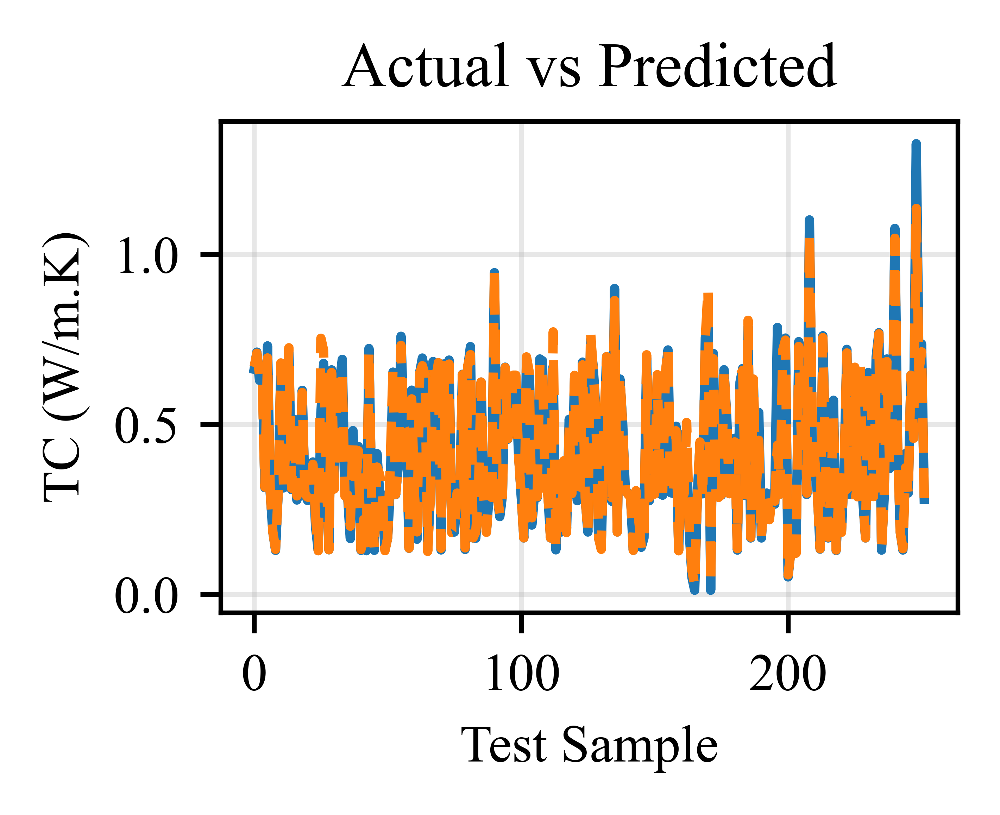

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

idx = np.arange(len(y_test))

plt.figure(figsize=(2.5, 2), dpi=1200)

plt.plot(idx, y_test.values, linewidth=1.6, label="Actual")
plt.plot(idx, y_test_pred_xgb_woa, linewidth=1.6, linestyle="--", label="Predicted")

plt.xlabel("Test Sample")
plt.ylabel("TC (W/m.K)")
plt.title("Actual vs Predicted")

#plt.legend(frameon=False)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

Scatter Plot WOA

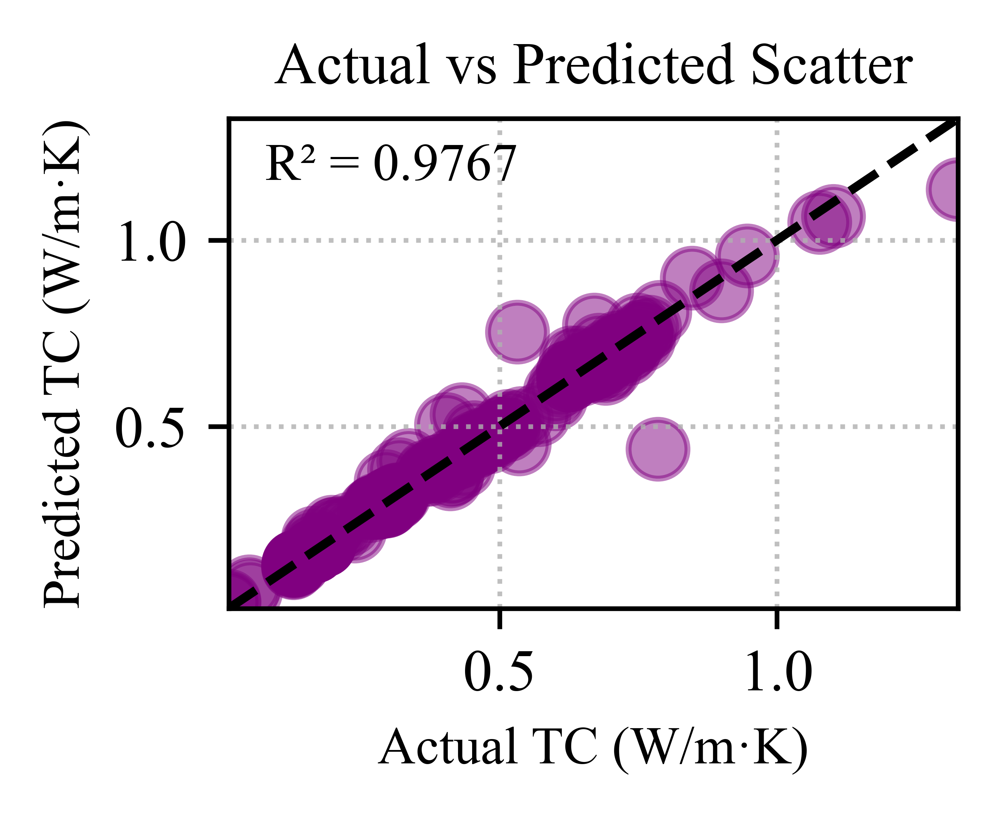

In [ ]:
import matplotlib.pyplot as plt

# ---------- WOA predictions (make sure this exists) ----------
# y_test_pred_xgb_woa = best_xgb_pipeline_woa.predict(X_test)

# Global axis limits (consistent scaling)
global_min_woa = min(y_test.min(), y_test_pred_xgb_woa.min())
global_max_woa = max(y_test.max(), y_test_pred_xgb_woa.max())

plt.figure(figsize=(2.5, 2), dpi=1200)

plt.scatter(
    y_test,
    y_test_pred_xgb_woa,
    s=100,
    alpha=0.5,
    color='purple',     # choose any color you like
    marker='o'
)

# Perfect fit line
plt.plot(
    [global_min_woa, global_max_woa],
    [global_min_woa, global_max_woa],
    linestyle='--',
    color='black'
)

# Force same scale
plt.xlim(global_min_woa, global_max_woa)
plt.ylim(global_min_woa, global_max_woa)

plt.xlabel("Actual TC (W/m·K)", fontsize=9, fontproperties=times_font)
plt.ylabel("Predicted TC (W/m·K)", fontsize=9, fontproperties=times_font)
plt.title("Actual vs Predicted Scatter", fontsize=9, fontproperties=times_font)

plt.text(
    0.05, 0.95,
    f"R² = {r2_score(y_test, y_test_pred_xgb_woa):.4f}",
    transform=plt.gca().transAxes,
    verticalalignment='top',
    fontsize=9, fontproperties=times_font
)

plt.xticks(fontsize=9, fontproperties=times_font)
plt.yticks(fontsize=9, fontproperties=times_font)

plt.grid(True, linestyle=':', alpha=0.8)
plt.tight_layout()
plt.show()

# Improved Sparrow Search Algorithms (ISSA)

In [ ]:
import numpy as np
import pandas as pd
import math

from sklearn.model_selection import train_test_split, KFold
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.impute import KNNImputer
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from xgboost import XGBRegressor

# ===================== DATA PREPARATION =====================
target_col = 'thermal_cond_W/m.K'
cat_cols = ['Nano_particle', 'base_fluid']
num_cols = [c for c in df.columns if c not in cat_cols + [target_col]]

X = df[cat_cols + num_cols].copy()
y = df[target_col].copy()

mask = ~y.isna()
X = X[mask].reset_index(drop=True)
y = y[mask].reset_index(drop=True)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42
)
X_train = X_train.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)
X_test  = X_test.reset_index(drop=True)
y_test  = y_test.reset_index(drop=True)

# ===================== PREPROCESSOR ======================
numeric_pipeline = Pipeline([
    ("imputer", KNNImputer(n_neighbors=5)),
    ("scaler", StandardScaler())
])

try:
    ohe = OneHotEncoder(sparse_output=False, handle_unknown="ignore")
except TypeError:
    ohe = OneHotEncoder(sparse=False, handle_unknown="ignore")

categorical_pipeline = Pipeline([("onehot", ohe)])

preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_pipeline, num_cols),
        ("cat", categorical_pipeline, cat_cols)
    ]
)

# ===================== OBJECTIVE: 5-FOLD CV RMSE ======================
def cv_rmse_objective(params, X_tr=X_train, y_tr=y_train, cv=5, seed=42):
    lr = float(params[0])
    n_est = int(params[1])
    max_depth = int(params[2])
    subs = float(params[3])
    col = float(params[4])
    gamma = float(params[5])
    reg_alpha = float(params[6])
    reg_lambda = float(params[7])

    # safety clamps
    lr = min(max(lr, 0.001), 1.0)
    n_est = max(n_est, 10)
    max_depth = max(max_depth, 1)
    subs = min(max(subs, 0.01), 1.0)
    col = min(max(col, 0.01), 1.0)
    gamma = max(gamma, 0.0)
    reg_alpha = max(reg_alpha, 0.0)
    reg_lambda = max(reg_lambda, 0.0)

    xgb = XGBRegressor(
        random_state=42,
        objective="reg:squarederror",
        eval_metric="rmse",
        learning_rate=lr,
        n_estimators=n_est,
        max_depth=max_depth,
        subsample=subs,
        colsample_bytree=col,
        gamma=gamma,
        reg_alpha=reg_alpha,
        reg_lambda=reg_lambda,
        n_jobs=-1
    )

    pipe = Pipeline([
        ("preprocessor", preprocessor),
        ("model", xgb)
    ])

    kf = KFold(n_splits=cv, shuffle=True, random_state=seed)
    rmses = []
    for tr_idx, va_idx in kf.split(X_tr):
        pipe.fit(X_tr.iloc[tr_idx], y_tr.iloc[tr_idx])
        pred = pipe.predict(X_tr.iloc[va_idx])
        rmses.append(np.sqrt(mean_squared_error(y_tr.iloc[va_idx], pred)))

    return float(np.mean(rmses))

# ===================== ISSA (Improved Sparrow Search Algorithm) ======================
class ISSA:
    """
    Improved Sparrow Search Algorithm (ISSA) for continuous optimization.
    Improvements used:
      - Chaotic (logistic) initialization
      - Adaptive step size
      - Occasional Lévy-flight perturbation
    """

    def __init__(self, func, lb, ub, pop_size=20, iters=30,
                 PD=0.2, SD=0.1, ST=0.7, seed=42):
        """
        PD: proportion of discoverers
        SD: proportion of aware/warners
        ST: safety threshold in SSA (0~1)
        """
        self.func = func
        self.lb = np.array(lb, dtype=float)
        self.ub = np.array(ub, dtype=float)
        self.dim = len(lb)
        self.pop = pop_size
        self.iters = iters
        self.PD = PD
        self.SD = SD
        self.ST = ST
        self.rng = np.random.default_rng(seed)

        self.X = self._chaotic_init()
        self.f = np.full(self.pop, np.inf)

        self.best_x = None
        self.best_f = np.inf
        self.worst_x = None
        self.worst_f = -np.inf

    def _clip(self, x):
        return np.clip(x, self.lb, self.ub)

    def _chaotic_init(self):
        # Logistic map chaotic init in [0,1] then scale to [lb,ub]
        x = self.rng.random((self.pop, self.dim))
        r = 4.0
        for _ in range(20):  # burn-in
            x = r * x * (1 - x)
        return self.lb + x * (self.ub - self.lb)

    def _levy_step(self, beta=1.5):
        sigma_u = (math.gamma(1 + beta) * math.sin(math.pi * beta / 2) /
                   (math.gamma((1 + beta) / 2) * beta * 2 ** ((beta - 1) / 2))) ** (1 / beta)
        u = self.rng.normal(0, sigma_u, self.dim)
        v = self.rng.normal(0, 1, self.dim)
        return u / (np.abs(v) ** (1 / beta) + 1e-12)

    def optimize(self, verbose=True):
        # Evaluate initial population
        for i in range(self.pop):
            self.X[i] = self._clip(self.X[i])
            self.f[i] = self.func(self.X[i])

        for t in range(1, self.iters + 1):
            # Sort by fitness (ascending: RMSE)
            idx = np.argsort(self.f)
            self.X = self.X[idx]
            self.f = self.f[idx]

            self.best_x, self.best_f = self.X[0].copy(), self.f[0]
            self.worst_x, self.worst_f = self.X[-1].copy(), self.f[-1]

            # Role counts
            n_discover = max(1, int(self.PD * self.pop))
            n_aware = max(1, int(self.SD * self.pop))

            # adaptive factor (decreases)
            alpha = 1.0 - (t / (self.iters + 1))

            # Random safety indicator
            R2 = self.rng.random()

            # ================= Discoverers update =================
            for i in range(n_discover):
                if R2 < self.ST:
                    # safe → exponential decay move
                    self.X[i] = self.X[i] * np.exp(-(i + 1) / (self.rng.random() * self.iters + 1e-12))
                else:
                    # danger → random walk
                    self.X[i] = self.X[i] + self.rng.normal(0, 1, self.dim) * alpha * (self.ub - self.lb) * 0.05

                # occasional Lévy jump (improvement)
                if self.rng.random() < 0.15:
                    self.X[i] = self.X[i] + 0.03 * alpha * self._levy_step() * (self.ub - self.lb)

                self.X[i] = self._clip(self.X[i])

            # ================= Joiners update =================
            for i in range(n_discover, self.pop):
                if i > self.pop / 2:
                    # farther from best -> move away from worst
                    step = self.rng.normal(0, 1, self.dim)
                    self.X[i] = step * np.exp((self.worst_x - self.X[i]) / ((i + 1) ** 2 + 1e-12))
                else:
                    # move toward best
                    A = self.rng.normal(0, 1, self.dim)
                    self.X[i] = self.best_x + np.abs(self.X[i] - self.best_x) * A * 0.3

                # small adaptive noise
                self.X[i] = self.X[i] + self.rng.normal(0, 1, self.dim) * alpha * (self.ub - self.lb) * 0.01
                self.X[i] = self._clip(self.X[i])

            # ================= Aware (warners) update =================
            aware_idx = self.rng.choice(self.pop, size=n_aware, replace=False)
            for j in aware_idx:
                if self.f[j] > self.best_f:
                    # move closer to best
                    self.X[j] = self.best_x + self.rng.normal(0, 1, self.dim) * np.abs(self.X[j] - self.best_x)
                else:
                    # move away from worst
                    k = self.rng.random()
                    self.X[j] = self.X[j] + (2 * k - 1) * np.abs(self.X[j] - self.worst_x)

                self.X[j] = self._clip(self.X[j])

            # ================= Re-evaluate =================
            for i in range(self.pop):
                f_new = self.func(self.X[i])
                self.f[i] = f_new

            if verbose:
                print(f"Iter {t:02d}/{self.iters} | Best CV RMSE: {self.best_f:.6f}")

        return self.best_x, self.best_f

# ===================== BOUNDS =====================
lb = [0.01, 100, 3, 0.6, 0.6, 0.0, 0.0, 0.0]
ub = [0.10, 500, 12, 1.0, 1.0, 0.2, 0.1, 0.1]

# ===================== RUN ISSA =====================
issa = ISSA(
    func=cv_rmse_objective,
    lb=lb, ub=ub,
    pop_size=10,
    iters=20,
    PD=0.2,
    SD=0.1,
    ST=0.7,
    seed=42
)

best_pos, best_cv_rmse = issa.optimize(verbose=True)

# ===================== 5-FOLD CV RMSE (Mean ± Std) =====================
kf = KFold(n_splits=5, shuffle=True, random_state=42)
cv_rmse_scores = []

for tr_idx, va_idx in kf.split(X_train):

    fold_model = XGBRegressor(
        random_state=42,
        objective="reg:squarederror",
        eval_metric="rmse",
        learning_rate=float(best_pos[0]),
        n_estimators=int(best_pos[1]),
        max_depth=int(best_pos[2]),
        subsample=float(best_pos[3]),
        colsample_bytree=float(best_pos[4]),
        gamma=float(best_pos[5]),
        reg_alpha=float(best_pos[6]),
        reg_lambda=float(best_pos[7]),
        n_jobs=-1
    )

    fold_pipeline = Pipeline([
        ("preprocessor", preprocessor),
        ("model", fold_model)
    ])

    fold_pipeline.fit(X_train.iloc[tr_idx], y_train.iloc[tr_idx])
    pred = fold_pipeline.predict(X_train.iloc[va_idx])

    rmse_fold = np.sqrt(mean_squared_error(y_train.iloc[va_idx], pred))
    cv_rmse_scores.append(rmse_fold)

cv_rmse_mean = np.mean(cv_rmse_scores)
cv_rmse_std = np.std(cv_rmse_scores)

print("\n✅ 5-Fold Cross-Validation Performance (ISSA–XGBoost)")
print(f"CV RMSE (Mean ± Std): {cv_rmse_mean:.6f} ± {cv_rmse_std:.6f}")

# ===================== RETRAIN WITH BEST PARAMS =====================
learning_rate_opt = float(best_pos[0])
n_estimators_opt  = int(best_pos[1])
max_depth_opt     = int(best_pos[2])
subsample_opt     = float(best_pos[3])
colsample_bytree_opt = float(best_pos[4])
gamma_opt         = float(best_pos[5])
reg_alpha_opt     = float(best_pos[6])
reg_lambda_opt    = float(best_pos[7])

best_xgb_model = XGBRegressor(
    random_state=42,
    objective="reg:squarederror",
    eval_metric="rmse",
    learning_rate=learning_rate_opt,
    n_estimators=n_estimators_opt,
    max_depth=max_depth_opt,
    subsample=subsample_opt,
    colsample_bytree=colsample_bytree_opt,
    gamma=gamma_opt,
    reg_alpha=reg_alpha_opt,
    reg_lambda=reg_lambda_opt,
    n_jobs=-1
)

best_xgb_pipeline = Pipeline([
    ("preprocessor", preprocessor),
    ("model", best_xgb_model)
])

# Train on full training data
best_xgb_pipeline.fit(X_train, y_train)

# Test prediction
y_test_pred_xgb_issa = best_xgb_pipeline.predict(X_test)

# ===================== TEST METRICS =====================
mse_issa  = mean_squared_error(y_test, y_test_pred_xgb_issa)
rmse_issa = np.sqrt(mse_issa)
mae_issa  = mean_absolute_error(y_test, y_test_pred_xgb_issa)
mape_issa = np.mean(np.abs((y_test - y_test_pred_xgb_issa) /
                           np.where(y_test == 0, 1e-8, y_test))) * 100
r2_issa   = r2_score(y_test, y_test_pred_xgb_issa)

print("\n✅ ISSA–XGBoost: Final Test Performance")
print(f"Test MSE  : {mse_issa:.6f}")
print(f"Test RMSE : {rmse_issa:.6f}")
print(f"Test MAE  : {mae_issa:.6f}")
print(f"Test MAPE : {mape_issa:.2f} %")
print(f"Test R²   : {r2_issa:.6f}")

# ===================== HYPERPARAMETER TABLE =====================
issa_params_df = pd.DataFrame({
    "learning_rate": learning_rate_opt,
    "n_estimators": n_estimators_opt,
    "max_depth": max_depth_opt,
    "subsample": subsample_opt,
    "colsample_bytree": colsample_bytree_opt,
    "gamma": gamma_opt,
    "reg_alpha": reg_alpha_opt,
    "reg_lambda": reg_lambda_opt
}, index=["ISSA-XGBoost"]).round(4)

print("\n✅ ISSA–XGBoost Optimized Hyperparameters Table")
print(issa_params_df)

Iter 01/20 | Best CV RMSE: 0.043996
Iter 02/20 | Best CV RMSE: 0.037985
Iter 03/20 | Best CV RMSE: 0.036940
Iter 04/20 | Best CV RMSE: 0.037155
Iter 05/20 | Best CV RMSE: 0.036652
Iter 06/20 | Best CV RMSE: 0.037230
Iter 07/20 | Best CV RMSE: 0.036640
Iter 08/20 | Best CV RMSE: 0.036537
Iter 09/20 | Best CV RMSE: 0.036518
Iter 10/20 | Best CV RMSE: 0.036259
Iter 11/20 | Best CV RMSE: 0.035872
Iter 12/20 | Best CV RMSE: 0.036155
Iter 13/20 | Best CV RMSE: 0.036229
Iter 14/20 | Best CV RMSE: 0.035261
Iter 15/20 | Best CV RMSE: 0.035428
Iter 16/20 | Best CV RMSE: 0.035558
Iter 17/20 | Best CV RMSE: 0.035244
Iter 18/20 | Best CV RMSE: 0.035661
Iter 19/20 | Best CV RMSE: 0.035538
Iter 20/20 | Best CV RMSE: 0.035358

✅ 5-Fold Cross-Validation Performance (ISSA–XGBoost)
CV RMSE (Mean ± Std): 0.035358 ± 0.003008

✅ ISSA–XGBoost: Final Test Performance
Test MSE  : 0.001363
Test RMSE : 0.036915
Test MAE  : 0.016744
Test MAPE : 5.14 %
Test R²   : 0.973639

✅ ISSA–XGBoost Optimized Hyperparameters

Line Comparison Plot ISSA

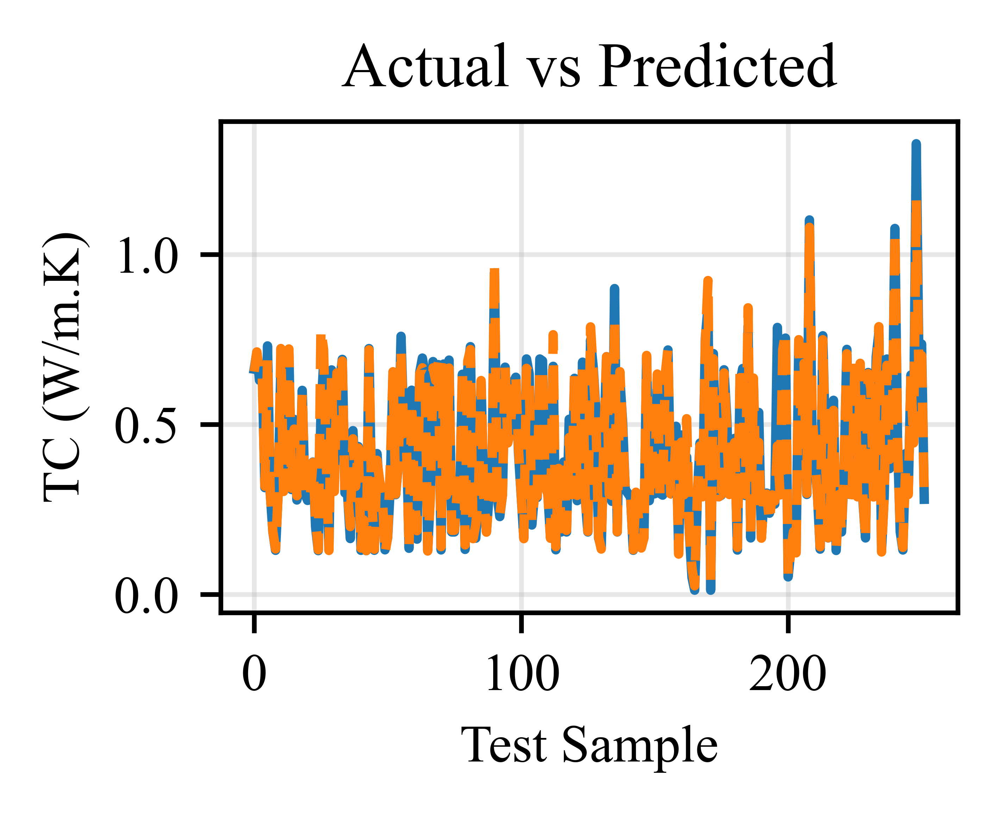

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

idx = np.arange(len(y_test))

plt.figure(figsize=(2.5, 2), dpi=1200)
plt.plot(idx, y_test.values, linewidth=1.6, label="Actual")
plt.plot(idx, y_test_pred_xgb_issa, linewidth=1.6, linestyle="--", label="Predicted")

plt.xlabel("Test Sample")
plt.ylabel("TC (W/m.K)")
plt.title("Actual vs Predicted")
#plt.legend(frameon=False)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

Scatter Plot ISSA

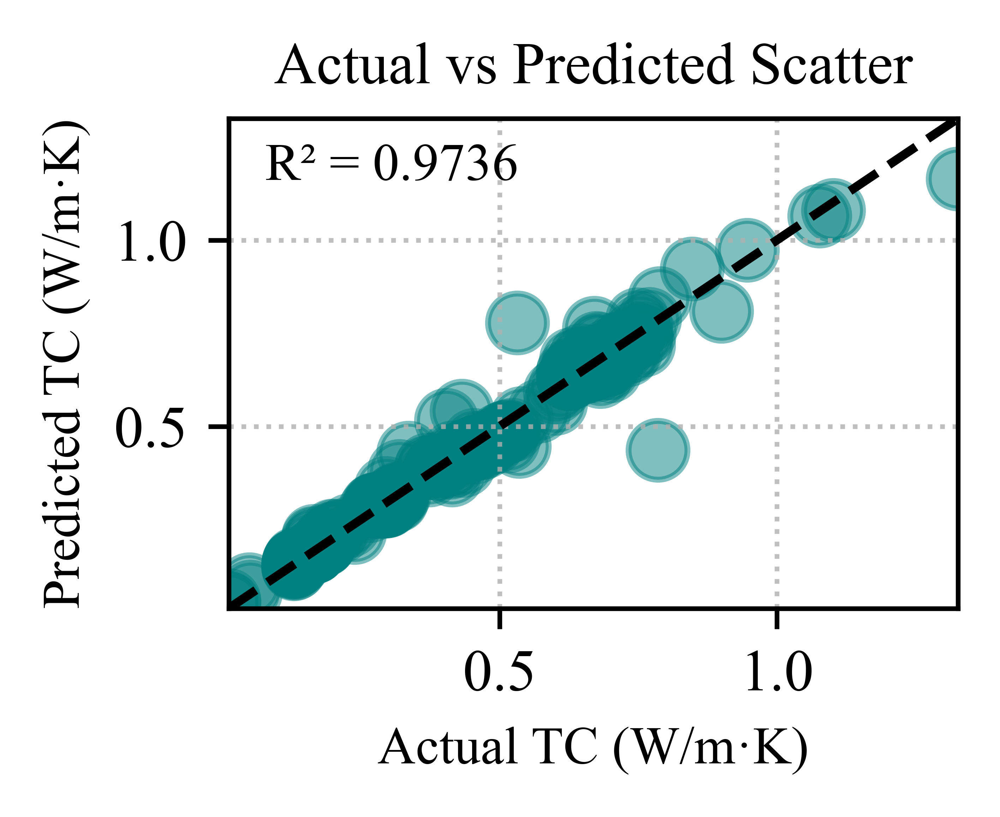

In [ ]:
import matplotlib.pyplot as plt

# ---------- ISSA predictions (make sure this exists) ----------
# y_test_pred_xgb_issa = best_xgb_pipeline_issa.predict(X_test)

# Global axis limits (consistent scaling)
global_min_issa = min(y_test.min(), y_test_pred_xgb_issa.min())
global_max_issa = max(y_test.max(), y_test_pred_xgb_issa.max())

plt.figure(figsize=(2.5, 2), dpi=1200)

plt.scatter(
    y_test,
    y_test_pred_xgb_issa,
    s=100,
    alpha=0.5,
    color='teal',       # choose any color you like
    marker='o'
)

# Perfect fit line
plt.plot(
    [global_min_issa, global_max_issa],
    [global_min_issa, global_max_issa],
    linestyle='--',
    color='black'
)

# Force same scale
plt.xlim(global_min_issa, global_max_issa)
plt.ylim(global_min_issa, global_max_issa)

plt.xlabel("Actual TC (W/m·K)", fontsize=9, fontproperties=times_font)
plt.ylabel("Predicted TC (W/m·K)", fontsize=9, fontproperties=times_font)
plt.title("Actual vs Predicted Scatter", fontsize=9, fontproperties=times_font)

plt.text(
    0.05, 0.95,
    f"R² = {r2_score(y_test, y_test_pred_xgb_issa):.4f}",
    transform=plt.gca().transAxes,
    verticalalignment='top',
    fontsize=9, fontproperties=times_font
)

plt.xticks(fontsize=9, fontproperties=times_font)
plt.yticks(fontsize=9, fontproperties=times_font)

plt.grid(True, linestyle=':', alpha=0.8)
plt.tight_layout()
plt.show()